In [1]:
# define logging and working directory
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.Notebook_imports import *
#from pyforest import *
from src.utils.Tensorflow_helper import choose_gpu_by_id
from tensorflow.keras.utils import plot_model

# define GPU id to use
GPU_IDS = '0,1'
GPUS = choose_gpu_by_id(GPU_IDS)
print(GPUS)

# jupyter magic config
%matplotlib inline
%reload_ext autoreload
%autoreload 2

# import helpers
from src.utils.Utils_io import Console_and_file_logger, init_config
from src.visualization.Visualize import show_2D_or_3D
from src.data.Dataset import get_img_msk_files_from_split_dir, load_acdc_files, get_train_data_from_df, get_trainings_files
from src.data.Generators import DataGenerator, get_samples
#from src.utils.unet_3d_metrics import weighted_dice_coefficient_loss
from src.utils.KerasCallbacks import get_callbacks
import cv2
import tensorflow as tf
from tensorflow.keras.losses import mse
import src.utils.Metrics_own as metr
import src.models.SpatialTransformer as st
from src.models.SpatialTransformer import  create_affine_cycle_transformer_model


# define experiment name for report, model and log paths + filenames
#EXPERIMENT = '3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights'
EXPERIMENT = '3D/ax_sax/weighting/mask2ax_1_ax_1_sax_0_ax_loss'
now = datetime.datetime.now()
# image params, change for different input data/architecture
ARCHITECTURE = '3D' # 2D
# path params
DATASET = 'GCN'  # 'acdc' # or 'gcn'
TRAIN_PATH = 'data/raw/{}/{}/train/'.format(DATASET, ARCHITECTURE)
VAL_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)
TEST_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)
#DF_DATA_PATH = 'data/raw/{}/{}/df_kfold.csv'.format(DATASET, ARCHITECTURE)
#DF_DATA_PATH = 'data/raw/miccai2020/2d_dataset.csv' # miccai special case
DATA_PATH = '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/'
FOLD = 2

MODEL_PATH = os.path.join('models', EXPERIMENT, str(now.strftime("%Y-%m-%d_%H_%M")))
TENSORBOARD_LOG_DIR = os.path.join('reports/tensorboard_logs', EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))
CONFIG_PATH = os.path.join('reports/configs/',EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))
HISTORY_PATH = os.path.join('reports/history/',EXPERIMENT,str(now.strftime("%Y-%m-%d_%H_%M")))

#DIM = [32,64, 64] # network input params for spacing of 5
DIM = [32, 64, 64]
DEPTH = 4 # number of down-/upsampling blocks
FILTERS = 16 # initial number of filters, will be doubled after each downsampling block
#SPACING = [8,1.1, 1,1] # used by sitk, order will be reversed to have the same shape as dim
SPACING = [5,5, 5] # if resample, resample to this spacing
M_POOL = [2, 2, 2]# used for downsampling and upsampling
F_SIZE = [3, 3, 3] # conv filter size
IMG_CHANNELS = 1
MASK_VALUES = [0, 1, 2, 3]  #channel order: Background, RV, MYO, LV
MASK_CLASSES = len(MASK_VALUES) # no of labels
BORDER_MODE = cv2.BORDER_REFLECT_101
IMG_INTERPOLATION = cv2.INTER_LINEAR
MSK_INTERPOLATION = cv2.INTER_NEAREST
AUGMENT = False
SHUFFLE = True
AUGMENT_GRID = False
RESAMPLE = True
SCALER = 'MinMax' # MinMax Standard or Robust
PROB_WEIGHT = 0.0
AX_WEIGHT = 1.0
SAX_WEIGHT = 0.0
USE_SAX2AX_PROB = False


# training params
#GENERATOR_WORKER = 6# if not set, use batchsize
SEED = 42 # define a seed for the generator shuffle
BATCHSIZE = 2 # 32, 64, 24, 16, 1 for 3D use: 8
INITIAL_EPOCH = 0 # change this to continue training
EPOCHS = 300 # define a maximum numbers of epochs
EPOCHS_BETWEEN_CHECKPOINTS = 5
MONITOR_FUNCTION = 'val_loss'
MONITOR_MODE = 'min'
SAVE_MODEL_FUNCTION = 'val_loss'
SAVE_MODEL_MODE = 'min'
BN_FIRST = False # decide if BN between Conv and activation or afterwards
BATCH_NORMALISATION = False # apply BN or not
USE_UPSAMPLE = True # otherwise use transpose
PAD = 'same' # padding strategy
KERNEL_INIT = 'he_normal' # conv weight initialisation
OPTIMIZER = 'adam' # Adam, Adagrad, RMSprop, Adadelta,  # https://keras.io/optimizers/
ACTIVATION = 'elu' # tf.keras.layers.LeakyReLU(), relu, any non linear activation function
LEARNING_RATE = 1e-4 # start with a huge lr to converge fast
DECAY_FACTOR = 0.3 # Define a learning rate decay for the ReduceLROnPlateau callback
MIN_LR = 1e-10 # smaller lr does not improve the model
DROPOUT_min = 0.3 # lower dropout at the shallow layers
DROPOUT_max = 0.5 # higher dropout at the deep layers

metrics = [
    metr.dice_coef_labels,
    metr.dice_coef_myo,
    metr.dice_coef_lv,
    metr.dice_coef_rv
]

#MASKING_VALUES = [2]
#MASKING_IMAGE = False

LOSS_FUNCTION = metr.bce_dice_loss
#LOSS_FUNCTION = metr.jaccard_distance_loss
#LOSS_FUNCTION = metr.bce_dice_jac_loss

Console_and_file_logger(EXPERIMENT, logging.INFO)

# Define a config for param injection,
# save a serialized version, 
# make sure all paths exist
config = init_config(config=locals(), save=True)
print(config)

search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/3d-mri-domain-adaption


2020-10-16 15:27:10,415 INFO -------------------- Start --------------------
2020-10-16 15:27:10,415 INFO Working directory: /mnt/ssd/git/3d-mri-domain-adaption.
2020-10-16 15:27:10,416 INFO Log file: ./logs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss.log
2020-10-16 15:27:10,416 INFO Log level for console: INFO


['/gpu:0', '/gpu:1']
{'GPU_IDS': '0,1', 'GPUS': ['/gpu:0', '/gpu:1'], 'EXPERIMENT': '3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss', 'ARCHITECTURE': '3D', 'DATASET': 'GCN', 'TRAIN_PATH': 'data/raw/GCN/3D/train/', 'VAL_PATH': 'data/raw/GCN/3D/val/', 'TEST_PATH': 'data/raw/GCN/3D/val/', 'DATA_PATH': '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/', 'FOLD': 3, 'MODEL_PATH': 'models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27', 'TENSORBOARD_LOG_DIR': 'reports/tensorboard_logs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27', 'CONFIG_PATH': 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27', 'HISTORY_PATH': 'reports/history/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27', 'DIM': [32, 64, 64], 'DEPTH': 4, 'FILTERS': 16, 'SPACING': [5, 5, 5], 'M_POOL': [2, 2, 2], 'F_SIZE': [3, 3, 3], 'IMG_CHANNELS': 1, 'MASK_VALUES': [0, 1, 2, 3], 'MASK_CLASSES': 4, 'BORDER_M

In [2]:
tf.test.is_built_with_cuda()
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:XLA_GPU:1', device_type='XLA_GPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]

In [3]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14590871544185690634
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 6784866070434583937
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 8698041374450255640
physical_device_desc: "device: XLA_GPU device"
, name: "/device:XLA_GPU:1"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 2344017737878186356
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 22883485696
locality {
  bus_id: 1
  links {
  }
}
incarnation: 5390254891209687337
physical_device_desc: "device: 0, name: TITAN RTX, pci bus id: 0000:01:00.0, compute capability: 7.5"
, name: "/device:GPU:1"
device_type: "GPU"
memory_limit: 23556507648
locality {
  bus_id: 1
  links {
  }
}
incarnation: 6987462396810

In [4]:
# Load AX slices

from src.data.Generators import MotionDataGenerator, CycleMotionDataGenerator
info = {}

x_train_ax, y_train_ax, x_val_ax, y_val_ax =  get_trainings_files(data_path=DATA_PATH,fold=FOLD)
config.update(info)
config = init_config(config)

logging.info('x_train files: {}, y_train files: {}'.format(len(x_train_ax), len(y_train_ax)))
logging.info('x_val files: {}, y_val files: {}'.format(len(x_val_ax), len(y_val_ax)))

2020-10-16 15:27:11,308 INFO Found 162 images/masks in /mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/
2020-10-16 15:27:11,309 INFO Patients train: 65
2020-10-16 15:27:11,314 INFO Selected 122 of 162 files with 65 of 86 patients for training fold 3
2020-10-16 15:27:11,315 INFO x_train files: 122, y_train files: 122
2020-10-16 15:27:11,316 INFO x_val files: 40, y_val files: 40


In [5]:
# load SAX slices
DATA_PATH_SAX = DATA_PATH.replace('AX_3D_ISO', 'AX_to_SAX_3D_ISO_SHIFT')
#DATA_PATH_SAX = 'data/interim/sax_ax_3d_thres_50_max/ax_to_sax'
x_train_sax, y_train_sax, x_val_sax, y_val_sax =  get_trainings_files(data_path=DATA_PATH_SAX,fold=FOLD)
config.update(info)
config = init_config(config)

logging.info('x_train files: {}, y_train files: {}'.format(len(x_train_sax), len(y_train_sax)))
logging.info('x_val files: {}, y_val files: {}'.format(len(x_val_sax), len(y_val_sax)))

2020-10-16 15:27:11,341 INFO Found 162 images/masks in /mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_to_SAX_3D_ISO_SHIFT/
2020-10-16 15:27:11,342 INFO Patients train: 65
2020-10-16 15:27:11,347 INFO Selected 122 of 162 files with 65 of 86 patients for training fold 3
2020-10-16 15:27:11,349 INFO x_train files: 122, y_train files: 122
2020-10-16 15:27:11,349 INFO x_val files: 40, y_val files: 40


In [6]:
print('ax examples: {}'.format(x_val_ax[:2]))
#print('sax_examples: {}'.format(x_train_sax[:2]))

ax examples: ['/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/0000-0PTV75MP_2005-06-27_ED_img.nrrd', '/mnt/ssd/git/3d-mri-domain-adaption/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/0000-0PTV75MP_2005-06-27_ES_img.nrrd']


In [7]:
# filter files by name
#x_train_ax = [x for x in x_train_ax if 'CT8YR38C_2005' in x]
print(len(x_train_ax))
#x_train_sax = [x for x in x_train_sax if 'CT8YR38C_2005' in x]

122


In [8]:
# config['BATCHSIZE'] = 32 # debug
batch_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, config)
valid_config = config.copy()
valid_config['AUGMENT_GRID'] = False
valid_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, valid_config)

2020-10-16 15:27:12,467 INFO Create DataGenerator
2020-10-16 15:27:12,468 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 2
 Scaler: MinMax
 Images: 122 
 Augment_grid: False 
 Thread workers: 2
2020-10-16 15:27:12,469 INFO No augmentation
2020-10-16 15:27:12,469 INFO Create DataGenerator
2020-10-16 15:27:12,470 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 2
 Scaler: MinMax
 Images: 40 
 Augment_grid: False 
 Thread workers: 2
2020-10-16 15:27:12,471 INFO No augmentation


In [9]:
# Select batch generator output
x = ''
y = ''
@interact
def select_batch(batch = (0,len(batch_generator), 1)):
    global x, y, x2, y2
    input_ , output_ = batch_generator.__getitem__(batch)
    x = input_[0]
    y = output_[0]
    x2 = input_[1]
    y2 = output_[1]
    logging.info('input elements: {}'.format(len(input_)))
    logging.info('output elements: {}'.format(len(output_)))
    logging.info(x.shape)
    logging.info(y.shape)
    logging.info(x2.shape)
    logging.info(y2.shape)

interactive(children=(IntSlider(value=30, description='batch', max=61), Output()), _dom_classes=('widget-inter…

In [10]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),slice_by=(1,6)):
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.DEBUG)
    temp_dir = 'reports/figures/temp/'
    ensure_dir(temp_dir)

    logging.info('AX: {}'.format(x[im].shape))
    show_2D_or_3D(x[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax.pdf'))
    plt.show()
    logging.info('AXtoSAX: {}'.format(y[im].shape))
    show_2D_or_3D(y[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax2sax.pdf'))
    plt.show()
    logging.info('SAX: {}'.format(x2[im].shape))
    show_2D_or_3D(x2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax.pdf'))
    plt.show()
    logging.info('SAXtoAX: {}'.format(y2[im].shape))
    show_2D_or_3D(y2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax2ax.pdf'))
    plt.show()
    

interactive(children=(IntSlider(value=0, description='im', max=1), IntSlider(value=3, description='slice_by', …

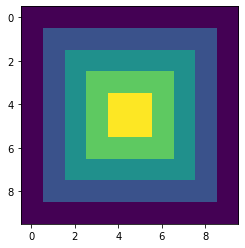

[[0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.  ]
 [0.   0.25 0.5  0.5  0.5  0.5  0.5  0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 0.75 0.75 0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 1.   1.   0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 1.   1.   0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.75 0.75 0.75 0.75 0.5  0.25 0.  ]
 [0.   0.25 0.5  0.5  0.5  0.5  0.5  0.5  0.25 0.  ]
 [0.   0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.25 0.  ]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  ]]


In [11]:
import numpy as np
x_shape = 10
y_shape = 10
temp = np.zeros((x_shape, y_shape))
weights_distribution = np.linspace(0, 1, x_shape // 2)
for i, l in enumerate(weights_distribution):
    temp[i:-i, i:-i] = l
plt.imshow(temp)
plt.show()
print(temp)

In [12]:
from tensorflow.keras.mixed_precision import experimental as mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)
print('Compute dtype: %s' % policy.compute_dtype)
print('Variable dtype: %s' % policy.variable_dtype)

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPUs will likely run quickly with dtype policy mixed_float16 as they all have compute capability of at least 7.0


2020-10-16 15:27:15,202 INFO Mixed precision compatibility check (mixed_float16): OK
Your GPUs will likely run quickly with dtype policy mixed_float16 as they all have compute capability of at least 7.0


Compute dtype: float16
Variable dtype: float32


In [13]:
# 2D unet
"""
load past config for model training 
"""
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
tf.print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
if 'config_chooser' in locals():
    config_file  = config_chooser.selected
else:
    #config_file = '/mnt/data/git/cardio/reports/configs/3D/wrapper/gcn_and_acdc_exlusive_ax/2020-07-23_20_49/config.json'
    config_file = '/mnt/ssd/git/3d-mri-domain-adaption/reports/configs/2D/gcn_and_acdc_excl_ax/config.json' # config for TMI paper
load = True # change to false, if this pipeline is used without finetuning
# load config with all params into global namespace
from src.models.ModelUtils import load_pretrained_model
if load: # load pretrained model
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))
    #logging.info('config:\n {}'.format(json.dumps(config, indent=4, sort_keys=True)))

    try:
        with strategy.scope():
            globals()['unet'] = load_pretrained_model(config_temp, metrics, comp=False)
            #globals()['unet'].summary()
    except Exception as e:
        logging.error(str(e))

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 15:27:15,499 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


Number of devices: 2


2020-10-16 15:27:15,503 INFO Load model from Experiment: 2D/ax_sax/gcn_and_acdc_exlusive_ax/
2020-10-16 15:27:15,504 INFO load model with keras api
2020-10-16 15:27:17,863 INFO Unable to restore custom object of type _tf_keras_metric currently. Please make sure that the layer implements `get_config`and `from_config` when saving. In addition, please use the `custom_objects` arg when calling `load_model()`.
2020-10-16 15:27:17,864 INFO Keras API failed, use json repr. load model from: models/2D/gcn_and_acdc_excl_ax/model.json .
2020-10-16 15:27:17,864 INFO loading model description


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,938 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,942 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,947 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,951 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,961 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,965 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,993 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:17,997 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:18,002 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


2020-10-16 15:27:18,005 INFO Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
2020-10-16 15:27:18,772 INFO loading model weights
2020-10-16 15:27:18,946 INFO model models/2D/gcn_and_acdc_excl_ax/model.json loaded


In [14]:
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
with strategy.scope():
    model = st.create_affine_cycle_transformer_model(config=config, metrics=metrics, unet=locals().get('unet', None))

Number of devices: 2
Instructions for updating:
Use fn_output_signature instead


2020-10-16 15:27:19,829 WARNING From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/util/deprecation.py:574: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Use fn_output_signature instead
2020-10-16 15:27:21,137 INFO unet given, use it to max probability


In [15]:
model.summary(line_length=150)
#plot_model(model, to_file='reports/figures/temp_graph.pdf',show_shapes=True)

Model: "affine_cycle_transformer"
______________________________________________________________________________________________________________________________________________________
Layer (type)                                     Output Shape                     Param #           Connected to                                      
input_1 (InputLayer)                             [(None, 32, 64, 64, 1)]          0                                                                   
______________________________________________________________________________________________________________________________________________________
conv_encoder (ConvEncoder)                       ((None, 2, 4, 4, 256), [(None, 3 3533456           input_1[0][0]                                     
______________________________________________________________________________________________________________________________________________________
global_average_pooling3d (GlobalAveragePooling3D (None, 256)

In [15]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),mask_smaller_than='0.01', slice_by=(1,6)):
    global m
    import numpy as np
    temp = x[im]
    sax = x2[im]
    temp_ = y[im]
    
    mask = temp_ >float(mask_smaller_than)
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on: {}'.format(temp.shape))
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, prob, ax_msk,m, m_mod = model.predict(x = [np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])                     
    logging.info('rotated by the model: {}'.format(pred[0].shape))
    show_2D_or_3D(pred[0][::slice_by], mask[::slice_by])
    plt.show()
    logging.info('inverse rotation on SAX: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    logging.info('predicted mask: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(prob[0][::slice_by])
    plt.show()
    logging.info('predicted mask in ax: {}'.format(ax_msk[0].shape))
    show_2D_or_3D(ax_msk[0][::slice_by])
    plt.show()
    
    # calculate the loss mask from target AX2SAX image
    mask = temp_ >float(mask_smaller_than)
    logging.info('masked by GT: {}'.format(mask.shape))
    masked = pred[0] * mask
    show_2D_or_3D(masked[::slice_by], mask[::slice_by])
    plt.show()
    logging.info('target (AX2SAX): {}'.format(temp_.shape))
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('Created MSE mask by thresholding the target (AX2SAX) with {}: {}'.format(mask_smaller_than,temp_.shape))
    show_2D_or_3D(mask[::slice_by])
    plt.show()
    logging.info('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
    logging.info('prob loss: {}'.format(metr.max_volume_loss(min_probabillity=0.5)(temp_[tf.newaxis,...],prob).numpy().mean()))
    try:
        print(np.reshape(m[0],(3,4)))
        print(np.reshape(m_mod[0],(3,4)))
    except Exception as e:
        pass

interactive(children=(IntSlider(value=0, description='im', max=1), Text(value='0.01', description='mask_smalle…

In [15]:
# train one model
initial_epoch = 0
# training

# start a new main process for this training to free gpu memory afterwards
logging.info('Fit model, start trainings process')
# fit model with trainingsgenerator
results = model.fit(
    x=batch_generator,
    validation_data=valid_generator,
    validation_steps=len(valid_generator),
    epochs=200,
    callbacks = get_callbacks(config),
    steps_per_epoch = len(batch_generator),
    initial_epoch=initial_epoch,
    #max_queue_size=24,
    #workers=10,
    verbose=1)

2020-10-16 15:27:28,943 INFO Fit model, start trainings process


Epoch 1/200
Instructions for updating:
Use `tf.data.Iterator.get_next_as_optional()` instead.


2020-10-16 15:27:30,128 WARNING From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/data/ops/multi_device_iterator_ops.py:601: get_next_as_optional (from tensorflow.python.data.ops.iterator_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.data.Iterator.get_next_as_optional()` instead.


INFO:tensorflow:batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


2020-10-16 15:27:50,916 INFO batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


INFO:tensorflow:batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


2020-10-16 15:28:14,716 INFO batch_all_reduce: 24 all-reduces with algorithm = nccl, num_packs = 1


 1/61 [..............................] - ETA: 0s - loss: 1.3161 - ax2sax_loss: 0.0185 - sax2ax_loss: 0.0143 - mask_prob_loss: 0.9882WARNING:tensorflow:From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2020-10-16 15:28:53,439 WARNING From /home/sven/anaconda3/envs/ax2sax/lib/python3.6/site-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


61/61 [==============================] - ETA: 0s - loss: 1.2198 - ax2sax_loss: 0.0132 - sax2ax_loss: 0.0101 - mask_prob_loss: 0.9872
Epoch 00001: val_loss improved from inf to 1.24076, saving model to models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/model.h5
61/61 [==============================] - 60s 981ms/step - loss: 1.2198 - ax2sax_loss: 0.0132 - sax2ax_loss: 0.0101 - mask_prob_loss: 0.9872 - val_loss: 1.2408 - val_ax2sax_loss: 0.0150 - val_sax2ax_loss: 0.0107 - val_mask_prob_loss: 0.9837 - lr: 1.0000e-04
Epoch 2/200
61/61 [==============================] - ETA: 0s - loss: 1.1937 - ax2sax_loss: 0.0117 - sax2ax_loss: 0.0092 - mask_prob_loss: 0.9845
Epoch 00002: val_loss improved from 1.24076 to 1.23726, saving model to models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/model.h5
61/61 [==============================] - 41s 667ms/step - loss: 1.1937 - ax2sax_loss: 0.0117 - sax2ax_loss: 0.0092 - mask_prob_loss: 0.9845 - val_loss: 1.237

In [14]:
#tf.keras.models.save_model(model,filepath=config['MODEL_PATH'],overwrite=True,include_optimizer=False,save_format='tf')

2020-08-04 17:52:56,041 WARNING From /home/sven/anaconda3/envs/tf2/lib/python3.6/site-packages/tensorflow/python/training/tracking/tracking.py:110: Model.state_updates (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
2020-08-04 17:52:56,060 WARNING From /home/sven/anaconda3/envs/tf2/lib/python3.6/site-packages/tensorflow/python/training/tracking/tracking.py:110: Layer.updates (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
2020-08-04 17:54:16,519 INFO Assets written to: models/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_16_45/assets


In [16]:
config['MODEL_PATH']

'models/3D/ax_sax/weighting/mask_prob_1_ax_1_sax_1_unet/2020-10-01_10_13'

In [16]:
# load pre-trained AXtoSAX rotation model

"""
load past config for model training 
"""
if 'strategy' in locals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
#config_file  = 'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_08_29/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_10_30/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_11_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_13_34/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-25_11_04/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_10_24/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_14_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_16_27/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_20_53/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_22_26/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_08_08/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_09_23/config.json'

# Full 4folds
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-04_14_04/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_16_45/config.json' # fold0, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_23_22/config.json' # fold2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-05_08_42/config.json' # fold1, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-05_17_52/config.json' # fold3 2nd, guter Fold

# baseline_cycle fold 0 - did not converge in most of the folds
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_21_30/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_22_22/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_23_06/config.json'

# baseline_cycle
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_08_29/config.json' # fold0
# baseline_cycle Fold 1 did not converge, with this modification it learnt very well:  with 96 x 224 x 224 and inplane weighting
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_12_48/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_14_54/config.json' # fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_16_17/config.json' # fold 3

# full model with inplane
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_00_31/config.json' # fold 0
# fold 1 repeat, looks good 3D/ax_sax/full/baseline_cycle_unet/2020-08-07_16_42/
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_07_51/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_11_42/config.json' # fold 3, did not work
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_18_28/config.json' # fold 3
# on downsampled images
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-08_07_37/config.json' Fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_16_20/config.json' Fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_21_15/config.json' Fold 1

# baseline_unet
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_10_20/config.json' # fold 0
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_11_34/config.json' # fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_15_23/config.json' fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_13_02/config.json' # fold 3

# full model, with inplane and 128
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_16_24/config.json' # fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_18_38/config.json' #fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_11_53/config.json' # fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_12_57/config.json'# fold3

# temp
#config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_1_unet/2020-09-30_18_31/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_1_ax_1_sax_1_unet/2020-10-01_10_13/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_2_ax_2_sax_1_mask2ax_unet/2020-10-01_15_05/config.json'
# config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_2_mask2ax_unet/2020-10-01_16_17/config.json'

# Repeat full model on all folds with: weighting mask 1, ax 2, sax 2 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_2_sax_2_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax 1_ax_2_sax_2_full/2020-10-13_17_57/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_09_32/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_11_24/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_16_02/config.json' # Fold 3


# Repeat full model on all folds with: weighting mask 1, ax 10, sax 10 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_10_sax_10_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-14_23_10/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_08_48/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_10_44/config.json' # Fold 2 
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_09_45/config.json' # Fold 3

#Use the SAX prob for the loss instead the SAX2AX
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_10_37/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_12_37/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_13_15/config.json' # Fold 2
config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/config.json' # Fold 3


# Repeat model mit nur AX MSE als loss und inplane weighting
# saved as mask2ax0_ax1_sax0_baseline_post
# config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_14_50/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_16_39/config.json' # Fold 1
#config_file = 'reports/configs/config.json' # Fold 2




# load model via tf.keras.load_model (full), if not possible try with json and weights
from src.models.ModelUtils import load_pretrained_model
if True: # load pretrained model switch to run all cells
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))

    try:
        with strategy.scope():
            globals()['model'] = load_pretrained_model(config_temp, metrics, comp=False)
            #model.summary()
    except Exception as e:
        # create a new model and try to load the weights
        logging.error(str(e))
        with strategy.scope():
            globals()['model'] = st.create_affine_cycle_transformer_model(config=config_temp, metrics=metrics, unet=locals().get('unet', None))
            model.load_weights(os.path.join(config_temp['MODEL_PATH'],'model.h5'))

2020-10-16 16:06:36,799 INFO Load model from Experiment: 3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss
2020-10-16 16:06:36,799 INFO load model with keras api
2020-10-16 16:06:36,800 INFO SavedModel file does not exist at: models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/{saved_model.pbtxt|saved_model.pb}
2020-10-16 16:06:36,801 INFO Keras API failed, use json repr. load model from: models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/model.json .
2020-10-16 16:06:36,801 ERROR [Errno 2] No such file or directory: 'models/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/model.json'


Number of devices: 2


2020-10-16 16:06:37,324 INFO unet given, use it to max probability


# Fast predictions with all files of the generator

In [17]:
from src.utils.Metrics_own import loss_with_margin as cube_loss
import numpy as np
cfg = config.copy()
cfg['BATCHSIZE'] = 10
cfg['AUGMENT_GRID'] = False
valid_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, cfg)
input_, output_ = valid_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, pred_mask, ax2sax_msk,m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])
    
    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation of the model')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask:')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    #print('MSE: {}'.format(mse(temp_, pred[0]).numpy().mean()))
    #print('max volume loss: {}'.format(metr.max_volume_loss(min_probabillity=0.8,z_weight=True)(temp[None,...], pred_mask).shape))
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-10-16 16:06:45,947 INFO Create DataGenerator
2020-10-16 16:06:45,948 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 10
 Scaler: MinMax
 Images: 122 
 Augment_grid: False 
 Thread workers: 10
2020-10-16 16:06:45,948 INFO No augmentation


interactive(children=(IntSlider(value=4, description='im', max=9), IntSlider(value=3, description='slice_by', …

# Predictions on the heldout test split

In [11]:
cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    
    pred, inv_pred, ax2sax_mod, pred_mask, ax_mask, m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])
    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('predicted in AX')
    show_2D_or_3D(ax_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    print('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
    #print('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-10-01 16:53:41,885 INFO Create DataGenerator
2020-10-01 16:53:41,886 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 32
2020-10-01 16:53:41,887 INFO No augmentation


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=3, description='slice_by'…

## 1. AX and SAX volumes 

Create a MotionDatagenerator from the heldout test split without shuffle and batchsize == len(files)

## 2. AX images and AX masks

Create a Datagenerator from AX image and mask files, both will be used in the next cell for the prediction pipeline

In [22]:
config

{'GPU_IDS': '0,1',
 'GPUS': ['/gpu:0', '/gpu:1'],
 'EXPERIMENT': '3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh',
 'ARCHITECTURE': '3D',
 'DATASET': 'GCN',
 'TRAIN_PATH': 'data/raw/GCN/3D/train/',
 'VAL_PATH': 'data/raw/GCN/3D/val/',
 'TEST_PATH': 'data/raw/GCN/3D/val/',
 'DATA_PATH': '/mnt/data/git/cardio/data/raw/gcn_05_2020_ax_sax_86/AX_3D_ISO/',
 'FOLD': 0,
 'MODEL_PATH': 'models/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'TENSORBOARD_LOG_DIR': 'reports/tensorboard_logs/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'CONFIG_PATH': 'reports/configs/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'HISTORY_PATH': 'reports/history/3D/ax_sax/register_ax_to_sax/concat_avg_flatten_2dense_thres_07_1_NOgridaugmentlossthresh/2020-07-13_21_49',
 'DIM': [32, 64,

In [22]:
# create a motion generator from the val files without shuffle for sorted predictions
from src.models.SpatialTransformer import create_affine_transformer_fixed
from src.data.Preprocess import from_channel_to_flat, transform_to_binary_mask
from src.data.Postprocess import clean_3d_prediction_3d_cc
import shutil
from src.data.Dataset import copy_meta_and_save
cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
cfg['SHUFFLE'] = False
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
msk_cfg = cfg.copy()
msk_cfg['IMG_CHANNELS'] = 1
msk_cfg['DIM'] = [128,224,224]
msk_cfg['SPACING'] = [1.5,1.5,1.5]
msk_cfg['RESAMPLE'] = True
v_msk_generator = DataGenerator(x_val_ax, y_val_ax, msk_cfg)
ax_full, ax_msk_ = v_msk_generator.__getitem__(0)

# unetwrapper
from src.models.KerasLayers import UnetWrapper
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

inp = Input((128, 224, 224, 1)) # one 3d volume in full resolution
out = UnetWrapper(unet=unet, resize=False)(inp)
unet_model = Model(inputs=[inp], outputs=[out])


2020-10-16 16:15:45,946 INFO Create DataGenerator
2020-10-16 16:15:45,947 INFO Datagenerator created with: 
 shape: [32, 64, 64]
 spacing: [5, 5, 5]
 batchsize: 40
 Scaler: MinMax
 Images: 40 
 Augment_grid: False 
 Thread workers: 32
2020-10-16 16:15:45,948 INFO No augmentation
2020-10-16 16:15:48,181 INFO Create DataGenerator
2020-10-16 16:15:48,182 INFO Datagenerator created with: 
 shape: [128, 224, 224]
 spacing: [1.5, 1.5, 1.5]
 batchsize: 40
 Scaler: MinMax
 Images: 40 
 Augment_grid: False 
 Thread workers: 32
2020-10-16 16:15:48,182 INFO No augmentation


## Predict AXtoSAX rotation, predict SAX Segmentation, rotate the mask reverse (SAXtoAX) by the predicted inverse
Complete pipeline:
1. AX_isotrop, 
2. Motion-generator which center crops or resize (needs to be changed) in plane, crop and pad in Z  to align to the network shape, no further resampling
3. Rotated into SAX domain by the trained Spatial-Transformer + Encoder (trained on the trainings split)
4. Mask prediction with a 3D Wrapper, fed with a pre-trained 2D unet (traind on fold1 from the improved SPIE pipeline)
5. Connected Component filtering & binarizing with a threshold of 0.5
6. Label-wise transformation of the mask back into the AX domain (with linear interpolation) inverted matrix from 3.
7. Second Connected Component Filtering (need to be checked if really necessary)
8. Copied the dicom metadata, direction and origin from the original AX_isotrop file to the predicted mask, the input AX image, and the AX GT mask, saved all three files
9. Evaluated 3D metrics on the Pred and GT 3D Masks, both files have a spacing of (1.5,1.5,1.5) and a size of 80,224,224 (better would be to use the AX_isotrop mask before the generator, therefore the generator steps need to be inverted, in some very few cases we resize here which is an nearest neighbor interpolation on the GT mask. This step could be changed to padding, but was kept to resize to align with the trainings preprocessing of the unet)

In [65]:
#### NEW VERSIoN WITH full resolution ####
import numpy as np
@interact_manual
def select_image_in_batch_(im=(0, ax_full.shape[0] - 1, 1), 
                          slice_n=(1, 10), 
                          export_path='data/predicted/temp/',
                          debug=False,
                         save=False,
                         postprocess=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :return: void
    """
    global m

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    ax_small = x_[im]
    ax2sax_small_gt_ = y_[im]
    #sax = x2_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level and plot the generator steps
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(ax_full_[::slice_n])
    plt.show()
    
    # TODO: change m and m_ if we modify the translation parameters
    # Predict rotation of AX_small and get transformation matrix
    pred, inv, pred_mod, prob, inv_msk, m, m_mod = model.predict(x=[np.expand_dims(ax_small, axis=0),np.expand_dims(ax_small,axis=0)])
    logging.info('AX --> SAX rotated by the model')
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    logging.info('AX --> SAX with modified m rotated by the model')
    if debug: show_2D_or_3D(pred_mod[0][::slice_n])
    plt.show()
    #if debug: show_2D_or_3D(pred[0][::slice_n], prob[0][::slice_n])
    #plt.show()
    inv_msk = inv_msk >= 0.5
        
    # scale the translation parameter of the affine matrix from spacing 5 to 1.5
    # Theese lines change m
    m_temp = m.copy()
    m_mod_temp = m_mod.copy()
    m_scaled = np.reshape(m_mod, (3,4))
    m_t = m_scaled[:,3] # slice translation
    m_t = (m_t *5)/1.5 # scale translation
    m_scaled[:,3] = m_t # slice scaled translation back into m
    print(m_scaled.shape)
    m_scaled_flatten = m_scaled.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (AX2SAX):')
    if debug: show_2D_or_3D(ax2sax_small_gt_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    ax2sax_full, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_scaled_flatten,axis=0)])
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3])
    plt.show()
    
    # reshape m to matrix
    # m = np.reshape(m, (3, 4))

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m_scaled # this m is already scaled
    # calc inverse, flatten the matrix and cut off the last row to fit the spatial transformer input shape
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]
    
    msk = unet_model.predict(x=[ax2sax_full])
    msk_binary = msk>=0.5
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask')
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3], msk_binary[0][::slice_n*3])
    plt.show()

    # apply inverse to our msk and plot it together with the inverse AXtoSAX
    logging.getLogger().setLevel(logging.ERROR)
    m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    inv_msk = list()
    for c in range(msk.shape[-1]):
        inv_m, _ = m_transformer.predict(
            x=[msk[..., c], np.expand_dims(m_matrix_inverse_flatten, axis=0)])
        inv_msk.append(inv_m[..., 0] >= 0.5)
    inv_msk = np.stack(inv_msk, axis=-1)
    
    # postprocessing
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
    plt.show()

    inv_msk = from_channel_to_flat(inv_msk[0])
    
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))

    if postprocess:
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        # maybe use a bigger kernel to close missed slices
        
        # make it bigger
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # make it thinner
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()

    # Finally keep only one CC per label
    inv_msk = clean_3d_prediction_3d_cc(inv_msk)

    logging.info('Predicted mask rotated to AX on original AX image')
    show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
    plt.show()

    # get the AX target segmentation, processed by the generator to have it in the same shape
    msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt)
    logging.info('GT on AX')
    show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3])
    plt.show()

    # create a nrrd file for the gt, pred and image volume
    sitk_pred = sitk.GetImageFromArray(inv_msk)
    sitk_ax_img = sitk.GetImageFromArray(ax_full_)
    sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

    ensure_dir(os.path.join(export_path, 'pred'))
    ensure_dir(os.path.join(export_path, 'image'))
    ensure_dir(os.path.join(export_path, 'gt'))

    # load a reference nrrd file, copy all metadata and save the volumes
    reference_sitk = sitk.ReadImage(full_file_name)
    if save:
        copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
        copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
        copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
    # shutil.copyfile(full_file_name, os.path.join(export_path, 'gt', filename))
    logging.info('inv mask shape: {}, gt mask shape: {}'.format(transform_to_binary_mask(inv_msk).shape, ax_msk_full_gt.shape))
    #logging.info('MSE: {}'.format(mse(pred[0], ax_full_).numpy().mean()))
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    globals()['gt'] = ax_msk_full_gt.astype(np.float32)
    globals()['pred'] = transform_to_binary_mask(inv_msk).astype(np.float32)
    #logging.info('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        logging.info('m: {}'.format(np.reshape(m_temp[0], (3, 4))))
        logging.info('m_mod: {}'.format(np.reshape(m_mod_temp[0], (3, 4))))
        logging.info('m_scaled: {}'.format(np.reshape(m_scaled, (3, 4))))
    except Exception as e:
        logging.error(str(e))
        pass


interactive(children=(IntSlider(value=19, description='im', max=39), IntSlider(value=5, description='slice_n',…

2020-10-16 19:21:31,818 INFO 0000-0PTV75MP_2005-06-27_ED_msk.nrrd
2020-10-16 19:21:31,818 INFO Prediction on AX volume:
2020-10-16 19:21:32,210 INFO AX --> SAX rotated by the model
2020-10-16 19:21:32,210 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:21:32,258 INFO Target (AX2SAX):
2020-10-16 19:21:32,258 INFO Repeat the transformation on the full resolution


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:32,259 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:21:35,390 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:35,391 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:36,316 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb9c0f0d08> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:21:37,049 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:21:37,179 INFO DICE RV: 0.8698189854621887
2020-10-16 19:21:37,257 INFO DICE LV: 0.9027109742164612
2020-10-16 1

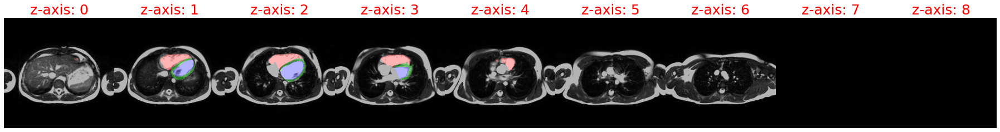

2020-10-16 19:21:38,196 INFO GT on AX


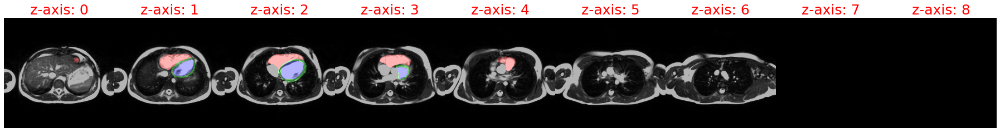

2020-10-16 19:21:38,643 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:21:38,719 INFO DICE LV: 0.9048967957496643
2020-10-16 19:21:38,794 INFO DICE MYO: 0.4899522662162781
2020-10-16 19:21:38,867 INFO DICE RV: 0.8882455229759216
2020-10-16 19:21:38,919 INFO m: [[ 0.4048  -0.9146   0.00865 -0.883  ]
 [ 0.4102   0.1898   0.8926  -0.703  ]
 [-0.8174  -0.3577   0.452    3.178  ]]
2020-10-16 19:21:38,919 INFO m_mod: [[ 0.4048  -0.9146   0.00865 -0.9526 ]
 [ 0.4102   0.1898   0.8926   1.847  ]
 [-0.8174  -0.3577   0.452    6.027  ]]
2020-10-16 19:21:38,920 INFO m_scaled: [[ 4.048e-01 -9.146e-01  8.652e-03 -3.174e+00]
 [ 4.102e-01  1.898e-01  8.926e-01  6.156e+00]
 [-8.174e-01 -3.577e-01  4.519e-01  2.009e+01]]
2020-10-16 19:21:38,920 INFO 0000-0PTV75MP_2005-06-27_ES_msk.nrrd
2020-10-16 19:21:38,921 INFO Prediction on AX volume:
2020-10-16 19:21:39,295 INFO AX --> SAX rotated by the model
2020-10-16 19:21:39,296 INFO AX --> SAX with modified m rotated

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:39,358 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:21:41,445 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:41,447 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:42,362 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb60265840> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:21:43,106 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:21:43,226 INFO DICE RV: 0.7918559908866882
2020-10-16 19:21:43,293 INFO DICE LV: 0.8474470376968384
2020-10-16 1

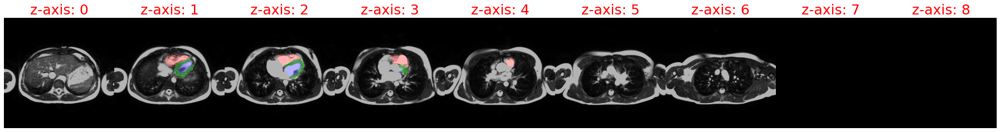

2020-10-16 19:21:44,229 INFO GT on AX


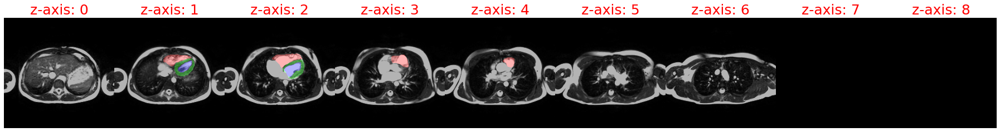

2020-10-16 19:21:44,670 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:21:44,738 INFO DICE LV: 0.8470125794410706
2020-10-16 19:21:44,805 INFO DICE MYO: 0.6637858152389526
2020-10-16 19:21:44,872 INFO DICE RV: 0.8100427389144897
2020-10-16 19:21:44,915 INFO m: [[ 3.997e-01 -9.165e-01  1.892e-03 -8.882e-01]
 [ 4.116e-01  1.812e-01  8.936e-01 -7.158e-01]
 [-8.193e-01 -3.564e-01  4.497e-01  3.248e+00]]
2020-10-16 19:21:44,915 INFO m_mod: [[ 3.997e-01 -9.165e-01  1.892e-03 -9.561e-01]
 [ 4.116e-01  1.812e-01  8.936e-01  1.903e+00]
 [-8.193e-01 -3.564e-01  4.497e-01  6.180e+00]]
2020-10-16 19:21:44,916 INFO m_scaled: [[ 3.997e-01 -9.165e-01  1.892e-03 -3.188e+00]
 [ 4.116e-01  1.812e-01  8.936e-01  6.344e+00]
 [-8.193e-01 -3.564e-01  4.497e-01  2.061e+01]]
2020-10-16 19:21:44,917 INFO 0000-0RPELLU8_2007-02-13_ED_msk.nrrd
2020-10-16 19:21:44,917 INFO Prediction on AX volume:
2020-10-16 19:21:45,282 INFO AX --> SAX rotated by the model
2020-10-16 19:2

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:45,331 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:21:47,421 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:47,423 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:49,350 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6ada5f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:21:50,098 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:21:50,227 INFO DICE RV: 0.8366350531578064
2020-10-16 19:21:50,303 INFO DICE LV: 0.9066713452339172
2020-10-16 1

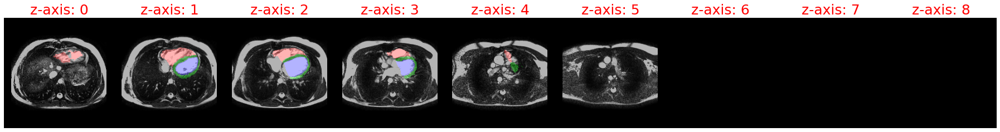

2020-10-16 19:21:51,265 INFO GT on AX


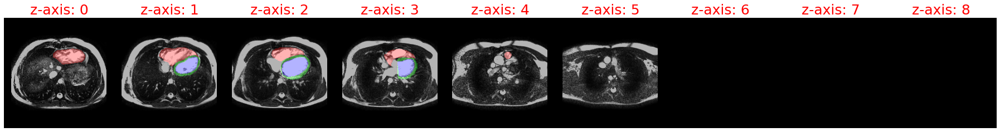

2020-10-16 19:21:51,708 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:21:51,786 INFO DICE LV: 0.9064471125602722
2020-10-16 19:21:51,863 INFO DICE MYO: 0.6140834093093872
2020-10-16 19:21:51,941 INFO DICE RV: 0.8474228978157043
2020-10-16 19:21:51,987 INFO m: [[ 0.3213  -0.9424  -0.08923 -0.9707 ]
 [ 0.438    0.06464  0.896   -0.9224 ]
 [-0.8394  -0.3271   0.4338   5.207  ]]
2020-10-16 19:21:51,988 INFO m_mod: [[ 0.3213  -0.9424  -0.08923 -0.9956 ]
 [ 0.438    0.06464  0.896    3.47   ]
 [-0.8394  -0.3271   0.4338  10.6    ]]
2020-10-16 19:21:51,988 INFO m_scaled: [[ 0.3213  -0.9424  -0.08923 -3.318  ]
 [ 0.438    0.06464  0.896   11.57   ]
 [-0.8394  -0.3271   0.4338  35.34   ]]
2020-10-16 19:21:51,989 INFO 0000-0RPELLU8_2007-02-13_ES_msk.nrrd
2020-10-16 19:21:51,989 INFO Prediction on AX volume:
2020-10-16 19:21:52,349 INFO AX --> SAX rotated by the model
2020-10-16 19:21:52,351 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:52,414 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:21:54,513 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:54,514 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:55,459 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb9c6926a8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:21:56,206 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:21:56,336 INFO DICE RV: 0.7686331868171692
2020-10-16 19:21:56,412 INFO DICE LV: 0.7980361580848694
2020-10-16 1

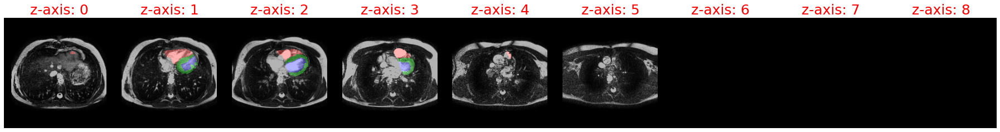

2020-10-16 19:21:57,349 INFO GT on AX


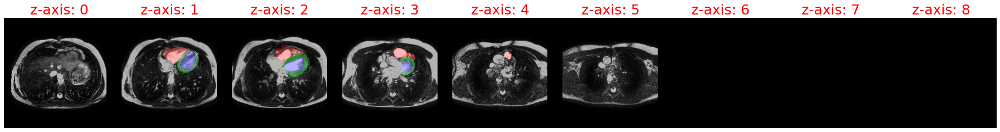

2020-10-16 19:21:57,789 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:21:57,861 INFO DICE LV: 0.8045802712440491
2020-10-16 19:21:57,935 INFO DICE MYO: 0.7067452073097229
2020-10-16 19:21:58,006 INFO DICE RV: 0.7787474989891052
2020-10-16 19:21:58,058 INFO m: [[ 0.3303  -0.9404  -0.0811  -0.961  ]
 [ 0.4348   0.07544  0.8975  -0.8975 ]
 [-0.838   -0.3315   0.4336   4.797  ]]
2020-10-16 19:21:58,059 INFO m_mod: [[ 0.3303  -0.9404  -0.0811  -0.9927 ]
 [ 0.4348   0.07544  0.8975   3.137  ]
 [-0.838   -0.3315   0.4336   9.664  ]]
2020-10-16 19:21:58,059 INFO m_scaled: [[ 0.3303  -0.9404  -0.0811  -3.31   ]
 [ 0.4348   0.07544  0.8975  10.46   ]
 [-0.838   -0.3315   0.4336  32.22   ]]
2020-10-16 19:21:58,060 INFO 0000-2HQVK81W_2005-03-11_ED_msk.nrrd
2020-10-16 19:21:58,061 INFO Prediction on AX volume:
2020-10-16 19:21:58,461 INFO AX --> SAX rotated by the model
2020-10-16 19:21:58,463 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:21:58,535 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:00,629 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:00,630 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:01,547 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb7d872e18> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:02,273 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:02,393 INFO DICE RV: 0.8704442977905273
2020-10-16 19:22:02,460 INFO DICE LV: 0.899644672870636
2020-10-16 19

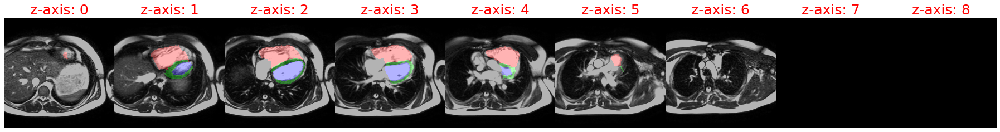

2020-10-16 19:22:03,442 INFO GT on AX


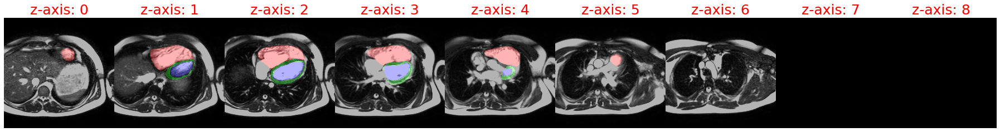

2020-10-16 19:22:03,898 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:03,966 INFO DICE LV: 0.9069405794143677
2020-10-16 19:22:04,034 INFO DICE MYO: 0.6581614017486572
2020-10-16 19:22:04,102 INFO DICE RV: 0.8735957741737366
2020-10-16 19:22:04,147 INFO m: [[ 0.3674  -0.929   -0.03662 -0.922  ]
 [ 0.4211   0.1311   0.8975  -0.8    ]
 [-0.829   -0.3452   0.4397   3.777  ]]
2020-10-16 19:22:04,147 INFO m_mod: [[ 0.3674  -0.929   -0.03662 -0.975  ]
 [ 0.4211   0.1311   0.8975   2.332  ]
 [-0.829   -0.3452   0.4397   7.363  ]]
2020-10-16 19:22:04,148 INFO m_scaled: [[ 0.3674  -0.929   -0.03662 -3.25   ]
 [ 0.4211   0.1311   0.8975   7.77   ]
 [-0.829   -0.3452   0.4397  24.55   ]]
2020-10-16 19:22:04,149 INFO 0000-2HQVK81W_2005-03-11_ES_msk.nrrd
2020-10-16 19:22:04,149 INFO Prediction on AX volume:
2020-10-16 19:22:04,549 INFO AX --> SAX rotated by the model
2020-10-16 19:22:04,551 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:04,615 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:06,729 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:06,731 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:07,665 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb73c72950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:08,396 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:08,527 INFO DICE RV: 0.792577862739563
2020-10-16 19:22:08,603 INFO DICE LV: 0.8003291487693787
2020-10-16 19

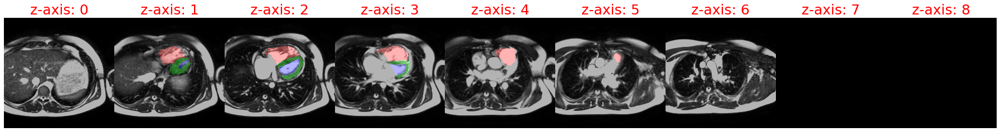

2020-10-16 19:22:09,550 INFO GT on AX


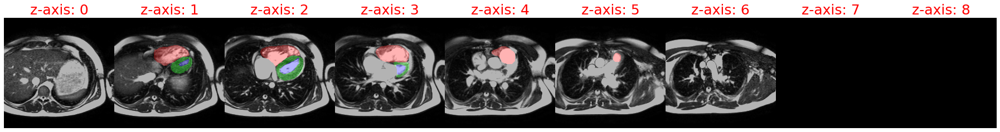

2020-10-16 19:22:10,012 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:10,089 INFO DICE LV: 0.7994616031646729
2020-10-16 19:22:10,164 INFO DICE MYO: 0.7132110595703125
2020-10-16 19:22:10,239 INFO DICE RV: 0.8148842453956604
2020-10-16 19:22:10,285 INFO m: [[ 0.373   -0.9272  -0.02995 -0.916  ]
 [ 0.4194   0.1394   0.897   -0.784  ]
 [-0.8276  -0.3474   0.4412   3.668  ]]
2020-10-16 19:22:10,285 INFO m_mod: [[ 0.373   -0.9272  -0.02995 -0.9717 ]
 [ 0.4194   0.1394   0.897    2.246  ]
 [-0.8276  -0.3474   0.4412   7.113  ]]
2020-10-16 19:22:10,286 INFO m_scaled: [[ 0.373   -0.9272  -0.02995 -3.24   ]
 [ 0.4194   0.1394   0.897    7.49   ]
 [-0.8276  -0.3474   0.4412  23.7    ]]
2020-10-16 19:22:10,287 INFO 0000-3E8U83K5_2006-04-01_ED_msk.nrrd
2020-10-16 19:22:10,287 INFO Prediction on AX volume:
2020-10-16 19:22:10,648 INFO AX --> SAX rotated by the model
2020-10-16 19:22:10,649 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:10,713 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:12,827 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:12,829 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:13,765 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb727a5bf8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:14,495 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:14,625 INFO DICE RV: 0.852104127407074
2020-10-16 19:22:14,699 INFO DICE LV: 0.8459071516990662
2020-10-16 19

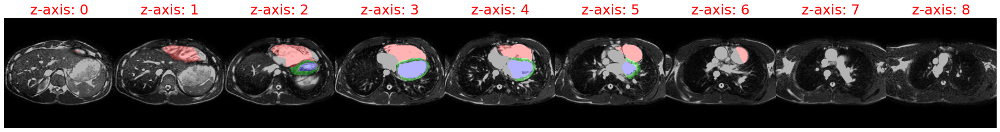

2020-10-16 19:22:15,660 INFO GT on AX


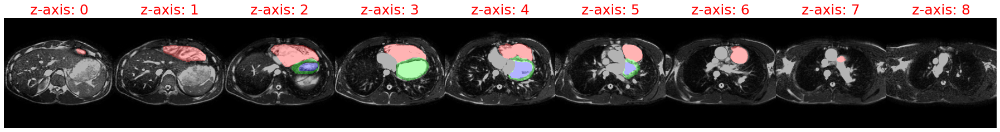

2020-10-16 19:22:16,121 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:16,195 INFO DICE LV: 0.8457808494567871
2020-10-16 19:22:16,268 INFO DICE MYO: 0.6616271734237671
2020-10-16 19:22:16,340 INFO DICE RV: 0.854398250579834
2020-10-16 19:22:16,391 INFO m: [[ 0.3398  -0.938   -0.06836 -0.951  ]
 [ 0.4302   0.09064  0.898   -0.875  ]
 [-0.836   -0.3347   0.4346   4.473  ]]
2020-10-16 19:22:16,392 INFO m_mod: [[ 0.3398  -0.938   -0.06836 -0.989  ]
 [ 0.4302   0.09064  0.898    2.889  ]
 [-0.836   -0.3347   0.4346   8.945  ]]
2020-10-16 19:22:16,392 INFO m_scaled: [[ 0.3398  -0.938   -0.06836 -3.297  ]
 [ 0.4302   0.09064  0.898    9.63   ]
 [-0.836   -0.3347   0.4346  29.81   ]]
2020-10-16 19:22:16,393 INFO 0000-3E8U83K5_2006-04-01_ES_msk.nrrd
2020-10-16 19:22:16,393 INFO Prediction on AX volume:
2020-10-16 19:22:16,782 INFO AX --> SAX rotated by the model
2020-10-16 19:22:16,783 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:16,831 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:18,917 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:18,919 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:19,842 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6b035620> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:20,571 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:20,691 INFO DICE RV: 0.7897136807441711
2020-10-16 19:22:20,759 INFO DICE LV: 0.856488823890686
2020-10-16 19

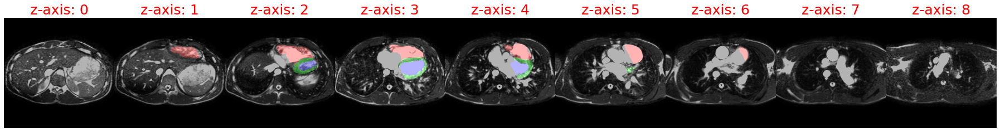

2020-10-16 19:22:21,704 INFO GT on AX


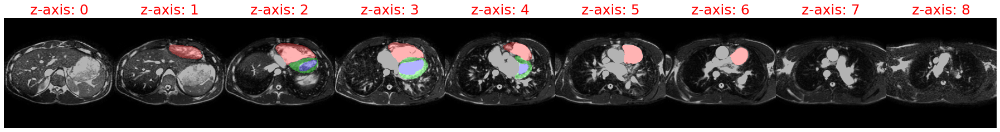

2020-10-16 19:22:22,163 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:22,233 INFO DICE LV: 0.8553484082221985
2020-10-16 19:22:22,300 INFO DICE MYO: 0.7652683854103088
2020-10-16 19:22:22,370 INFO DICE RV: 0.7927421927452087
2020-10-16 19:22:22,413 INFO m: [[ 0.3374  -0.939   -0.07166 -0.954  ]
 [ 0.4316   0.0865   0.898   -0.8823 ]
 [-0.837   -0.3337   0.4343   4.562  ]]
2020-10-16 19:22:22,414 INFO m_mod: [[ 0.3374  -0.939   -0.07166 -0.9897 ]
 [ 0.4316   0.0865   0.898    2.963  ]
 [-0.837   -0.3337   0.4343   9.15   ]]
2020-10-16 19:22:22,414 INFO m_scaled: [[ 0.3374  -0.939   -0.07166 -3.299  ]
 [ 0.4316   0.0865   0.898    9.875  ]
 [-0.837   -0.3337   0.4343  30.5    ]]
2020-10-16 19:22:22,415 INFO 0000-3E90836W_2006-05-23_ED_msk.nrrd
2020-10-16 19:22:22,415 INFO Prediction on AX volume:
2020-10-16 19:22:24,813 INFO AX --> SAX rotated by the model
2020-10-16 19:22:24,814 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:24,862 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:27,066 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:27,067 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:28,047 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb7d924598> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:28,787 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:28,911 INFO DICE RV: 0.759784996509552
2020-10-16 19:22:28,984 INFO DICE LV: 0.810509979724884
2020-10-16 19:

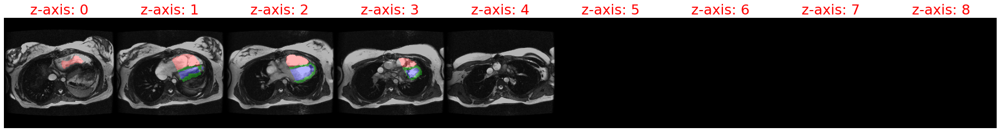

2020-10-16 19:22:29,908 INFO GT on AX


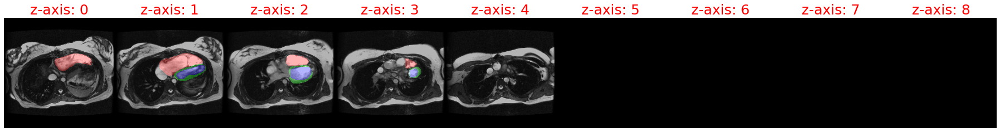

2020-10-16 19:22:30,352 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:30,425 INFO DICE LV: 0.8214578628540039
2020-10-16 19:22:30,496 INFO DICE MYO: 0.4814082384109497
2020-10-16 19:22:30,569 INFO DICE RV: 0.7668240666389465
2020-10-16 19:22:30,614 INFO m: [[ 0.342   -0.9375  -0.06555 -0.9487 ]
 [ 0.43     0.09436  0.8984  -0.866  ]
 [-0.8354  -0.3352   0.4353   4.383  ]]
2020-10-16 19:22:30,615 INFO m_mod: [[ 0.342   -0.9375  -0.06555 -0.9883 ]
 [ 0.43     0.09436  0.8984   2.807  ]
 [-0.8354  -0.3352   0.4353   8.75   ]]
2020-10-16 19:22:30,615 INFO m_scaled: [[ 0.342   -0.9375  -0.06555 -3.295  ]
 [ 0.43     0.09436  0.8984   9.35   ]
 [-0.8354  -0.3352   0.4353  29.17   ]]
2020-10-16 19:22:30,616 INFO 0000-3E90836W_2006-05-23_ES_msk.nrrd
2020-10-16 19:22:30,617 INFO Prediction on AX volume:
2020-10-16 19:22:30,997 INFO AX --> SAX rotated by the model
2020-10-16 19:22:30,998 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:31,047 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:33,183 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:33,185 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:34,130 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb65493ea0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:34,869 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:34,997 INFO DICE RV: 0.5907624363899231
2020-10-16 19:22:35,072 INFO DICE LV: 0.7284080386161804
2020-10-16 1

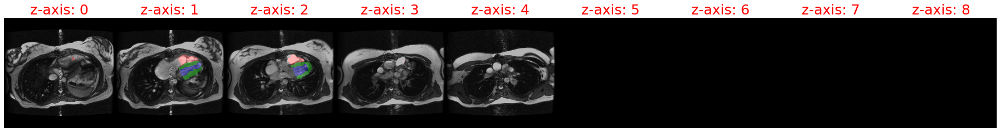

2020-10-16 19:22:35,997 INFO GT on AX


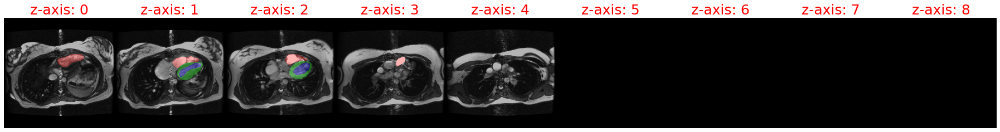

2020-10-16 19:22:36,442 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:36,517 INFO DICE LV: 0.7381173372268677
2020-10-16 19:22:36,592 INFO DICE MYO: 0.6247960925102234
2020-10-16 19:22:36,667 INFO DICE RV: 0.6366744041442871
2020-10-16 19:22:36,717 INFO m: [[ 0.3586 -0.9326 -0.0466 -0.9307]
 [ 0.424   0.1179  0.8984 -0.8203]
 [-0.832  -0.3418  0.4375  3.945 ]]
2020-10-16 19:22:36,718 INFO m_mod: [[ 0.3586 -0.9326 -0.0466 -0.9805]
 [ 0.424   0.1179  0.8984  2.451 ]
 [-0.832  -0.3418  0.4375  7.754 ]]
2020-10-16 19:22:36,718 INFO m_scaled: [[ 0.3586 -0.9326 -0.0466 -3.268 ]
 [ 0.424   0.1179  0.8984  8.17  ]
 [-0.832  -0.3418  0.4375 25.86  ]]
2020-10-16 19:22:36,719 INFO 0000-3HQQHA3N_2006-03-01_ED_msk.nrrd
2020-10-16 19:22:36,720 INFO Prediction on AX volume:
2020-10-16 19:22:37,098 INFO AX --> SAX rotated by the model
2020-10-16 19:22:37,099 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:22:37,151 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:37,153 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:39,289 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:39,291 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:40,234 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7febcdd32e18> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:40,987 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:41,116 INFO DICE RV: 0.5173560380935669
2020-10-16 19:22:41,194 INFO DICE LV: 0.7845823764801025
2020-10-16 1

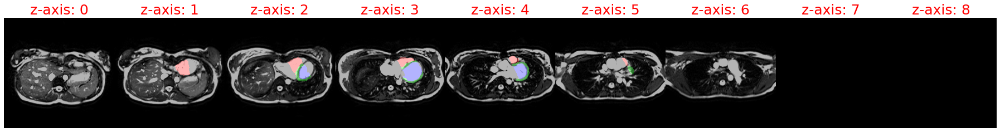

2020-10-16 19:22:42,156 INFO GT on AX


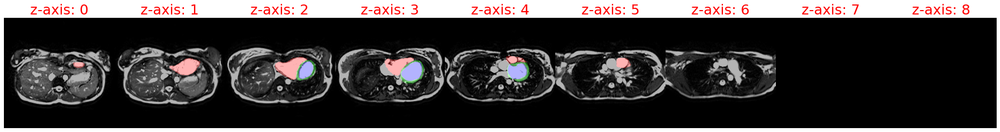

2020-10-16 19:22:42,613 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:42,689 INFO DICE LV: 0.7842434644699097
2020-10-16 19:22:42,764 INFO DICE MYO: 0.5851244330406189
2020-10-16 19:22:42,839 INFO DICE RV: 0.5162214040756226
2020-10-16 19:22:42,891 INFO m: [[ 0.3196  -0.9434  -0.08905 -0.973  ]
 [ 0.4397   0.0643   0.896   -0.929  ]
 [-0.8394  -0.3254   0.4353   5.336  ]]
2020-10-16 19:22:42,892 INFO m_mod: [[ 0.3196  -0.9434  -0.08905 -0.9956 ]
 [ 0.4397   0.0643   0.896    3.586  ]
 [-0.8394  -0.3254   0.4353  10.914  ]]
2020-10-16 19:22:42,892 INFO m_scaled: [[ 0.3196  -0.9434  -0.08905 -3.318  ]
 [ 0.4397   0.0643   0.896   11.96   ]
 [-0.8394  -0.3254   0.4353  36.38   ]]
2020-10-16 19:22:42,893 INFO 0000-3HQQHA3N_2006-03-01_ES_msk.nrrd
2020-10-16 19:22:42,893 INFO Prediction on AX volume:
2020-10-16 19:22:43,296 INFO AX --> SAX rotated by the model
2020-10-16 19:22:43,297 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:43,363 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:45,480 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:45,481 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:46,413 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7fec49d17f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:47,155 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:47,284 INFO DICE RV: 0.5346437692642212
2020-10-16 19:22:47,359 INFO DICE LV: 0.8375928997993469
2020-10-16 1

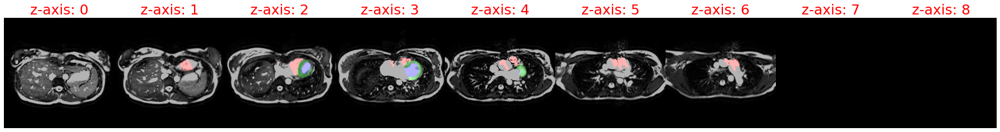

2020-10-16 19:22:48,295 INFO GT on AX


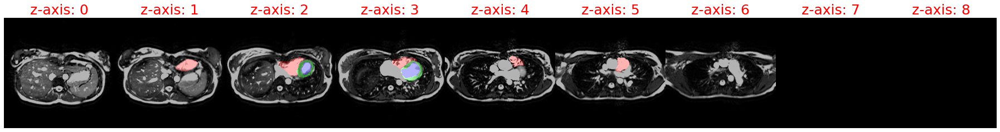

2020-10-16 19:22:48,743 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:48,818 INFO DICE LV: 0.8413063287734985
2020-10-16 19:22:48,892 INFO DICE MYO: 0.7067468762397766
2020-10-16 19:22:48,967 INFO DICE RV: 0.5555901527404785
2020-10-16 19:22:49,018 INFO m: [[ 0.3196  -0.9434  -0.08905 -0.973  ]
 [ 0.4397   0.0643   0.896   -0.9297 ]
 [-0.8394  -0.3254   0.4353   5.35   ]]
2020-10-16 19:22:49,018 INFO m_mod: [[ 0.3196  -0.9434  -0.08905 -0.996  ]
 [ 0.4397   0.0643   0.896    3.596  ]
 [-0.8394  -0.3254   0.4353  10.945  ]]
2020-10-16 19:22:49,019 INFO m_scaled: [[ 0.3196  -0.9434  -0.08905 -3.32   ]
 [ 0.4397   0.0643   0.896   11.99   ]
 [-0.8394  -0.3254   0.4353  36.47   ]]
2020-10-16 19:22:49,019 INFO 0000-4EUFPCDM_2007-01-15_ED_msk.nrrd
2020-10-16 19:22:49,020 INFO Prediction on AX volume:
2020-10-16 19:22:49,393 INFO AX --> SAX rotated by the model
2020-10-16 19:22:49,394 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:49,442 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:52,569 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:52,571 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:53,510 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb7ac8dc80> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:22:54,243 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:22:54,375 INFO DICE RV: 0.7825725674629211
2020-10-16 19:22:54,453 INFO DICE LV: 0.8507887721061707
2020-10-16 1

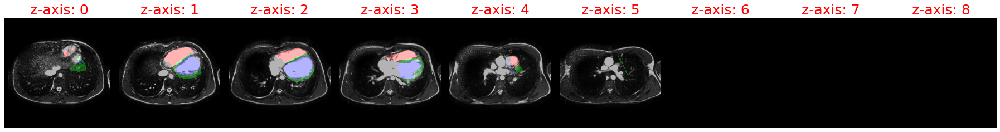

2020-10-16 19:22:55,402 INFO GT on AX


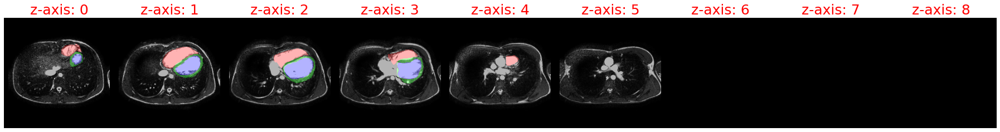

2020-10-16 19:22:55,850 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:22:55,925 INFO DICE LV: 0.8723458647727966
2020-10-16 19:22:55,998 INFO DICE MYO: 0.5220568180084229
2020-10-16 19:22:56,071 INFO DICE RV: 0.8020054697990417
2020-10-16 19:22:56,124 INFO m: [[ 0.3733  -0.9277  -0.02797 -0.915  ]
 [ 0.419    0.1418   0.897   -0.784  ]
 [-0.8276  -0.3464   0.4414   3.65   ]]
2020-10-16 19:22:56,125 INFO m_mod: [[ 0.3733  -0.9277  -0.02797 -0.9727 ]
 [ 0.419    0.1418   0.897    2.225  ]
 [-0.8276  -0.3464   0.4414   7.098  ]]
2020-10-16 19:22:56,125 INFO m_scaled: [[ 0.3733  -0.9277  -0.02797 -3.242  ]
 [ 0.419    0.1418   0.897    7.418  ]
 [-0.8276  -0.3464   0.4414  23.67   ]]
2020-10-16 19:22:56,126 INFO 0000-4EUFPCDM_2007-01-15_ES_msk.nrrd
2020-10-16 19:22:56,126 INFO Prediction on AX volume:
2020-10-16 19:22:56,496 INFO AX --> SAX rotated by the model
2020-10-16 19:22:56,497 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:56,545 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:22:59,665 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:22:59,666 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:00,597 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb65870c80> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:01,341 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:01,470 INFO DICE RV: 0.7069421410560608
2020-10-16 19:23:01,544 INFO DICE LV: 0.814310610294342
2020-10-16 19

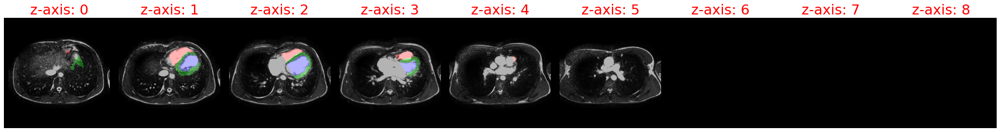

2020-10-16 19:23:02,492 INFO GT on AX


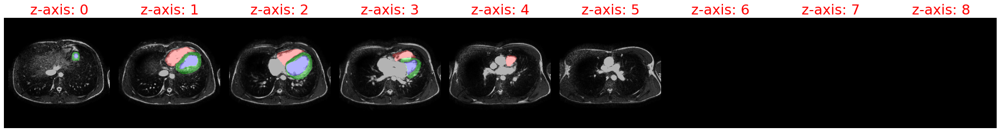

2020-10-16 19:23:02,932 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:03,012 INFO DICE LV: 0.8110243082046509
2020-10-16 19:23:03,088 INFO DICE MYO: 0.6106785535812378
2020-10-16 19:23:03,162 INFO DICE RV: 0.709128201007843
2020-10-16 19:23:03,213 INFO m: [[ 0.3894  -0.9214  -0.00955 -0.8984 ]
 [ 0.414    0.1658   0.895   -0.742  ]
 [-0.8228  -0.3525   0.446    3.385  ]]
2020-10-16 19:23:03,214 INFO m_mod: [[ 0.3894  -0.9214  -0.00955 -0.963  ]
 [ 0.414    0.1658   0.895    2.01   ]
 [-0.8228  -0.3525   0.446    6.492  ]]
2020-10-16 19:23:03,214 INFO m_scaled: [[ 3.894e-01 -9.214e-01 -9.552e-03 -3.209e+00]
 [ 4.141e-01  1.658e-01  8.950e-01  6.699e+00]
 [-8.228e-01 -3.525e-01  4.460e-01  2.164e+01]]
2020-10-16 19:23:03,215 INFO 0000-5T8DXCQ2_2006-10-01_ED_msk.nrrd
2020-10-16 19:23:03,215 INFO Prediction on AX volume:
2020-10-16 19:23:03,603 INFO AX --> SAX rotated by the model
2020-10-16 19:23:03,603 INFO AX --> SAX with modified m rotated 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:03,651 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:05,765 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:05,766 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:06,677 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feba79a8b70> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:07,412 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:07,540 INFO DICE RV: 0.8663312792778015
2020-10-16 19:23:07,615 INFO DICE LV: 0.9138596057891846
2020-10-16 1

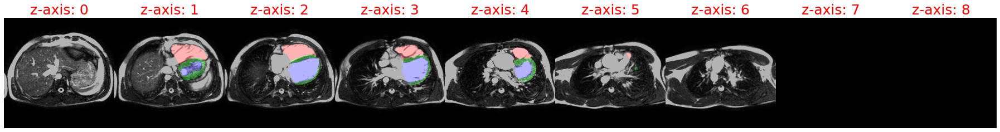

2020-10-16 19:23:08,573 INFO GT on AX


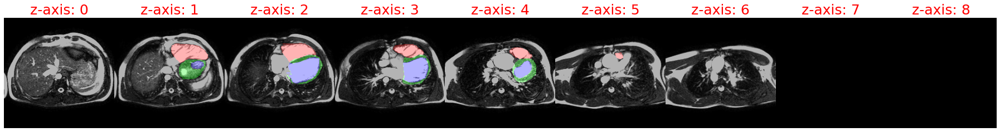

2020-10-16 19:23:09,020 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:09,092 INFO DICE LV: 0.9214341640472412
2020-10-16 19:23:09,165 INFO DICE MYO: 0.6289225220680237
2020-10-16 19:23:09,236 INFO DICE RV: 0.8681862950325012
2020-10-16 19:23:09,287 INFO m: [[ 0.3057  -0.9473  -0.09735 -0.988  ]
 [ 0.4465   0.05225  0.8936  -0.9673 ]
 [-0.841   -0.3164   0.4387   6.496  ]]
2020-10-16 19:23:09,287 INFO m_mod: [[ 0.3057  -0.9473  -0.09735 -0.999  ]
 [ 0.4465   0.05225  0.8936   4.527  ]
 [-0.841   -0.3164   0.4387  13.52   ]]
2020-10-16 19:23:09,288 INFO m_scaled: [[ 0.3057  -0.9473  -0.09735 -3.33   ]
 [ 0.4465   0.05225  0.8936  15.09   ]
 [-0.841   -0.3164   0.4387  45.1    ]]
2020-10-16 19:23:09,288 INFO 0000-5T8DXCQ2_2006-10-01_ES_msk.nrrd
2020-10-16 19:23:09,289 INFO Prediction on AX volume:
2020-10-16 19:23:09,665 INFO AX --> SAX rotated by the model
2020-10-16 19:23:09,665 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:09,714 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:11,801 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:11,803 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:12,720 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb65211950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:13,448 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:13,577 INFO DICE RV: 0.6731166243553162
2020-10-16 19:23:13,652 INFO DICE LV: 0.8245168328285217
2020-10-16 1

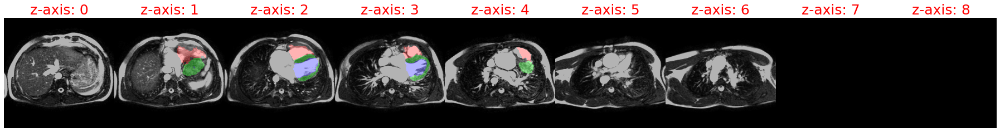

2020-10-16 19:23:14,603 INFO GT on AX


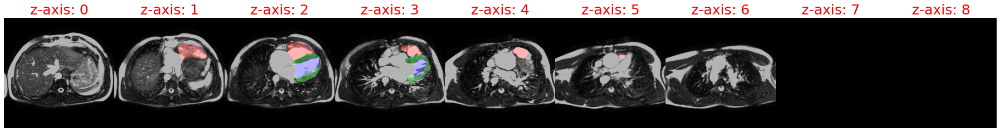

2020-10-16 19:23:15,050 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:15,126 INFO DICE LV: 0.8287463188171387
2020-10-16 19:23:15,201 INFO DICE MYO: 0.6389597654342651
2020-10-16 19:23:15,276 INFO DICE RV: 0.6964758038520813
2020-10-16 19:23:15,328 INFO m: [[ 0.3057 -0.9473 -0.0991 -0.9873]
 [ 0.4465  0.0507  0.8936 -0.9663]
 [-0.841  -0.3174  0.4382  6.465 ]]
2020-10-16 19:23:15,328 INFO m_mod: [[ 0.3057 -0.9473 -0.0991 -0.999 ]
 [ 0.4465  0.0507  0.8936  4.504 ]
 [-0.841  -0.3174  0.4382 13.445 ]]
2020-10-16 19:23:15,329 INFO m_scaled: [[ 0.3057 -0.9473 -0.0991 -3.33  ]
 [ 0.4465  0.0507  0.8936 15.01  ]
 [-0.841  -0.3174  0.4382 44.84  ]]
2020-10-16 19:23:15,329 INFO 0000-84R7FQH3_2007-03-16_ED_msk.nrrd
2020-10-16 19:23:15,330 INFO Prediction on AX volume:
2020-10-16 19:23:15,720 INFO AX --> SAX rotated by the model
2020-10-16 19:23:15,722 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:23:15,789 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:15,791 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:17,878 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:17,880 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:19,815 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb8dfbdf28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:20,557 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:20,688 INFO DICE RV: 0.7980770468711853
2020-10-16 19:23:20,764 INFO DICE LV: 0.8976001739501953
2020-10-16 1

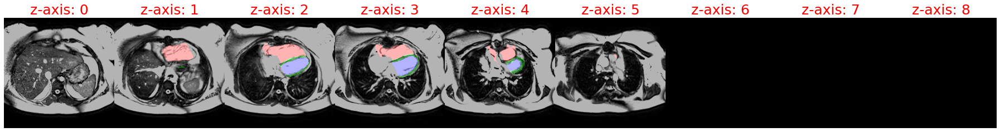

2020-10-16 19:23:21,731 INFO GT on AX


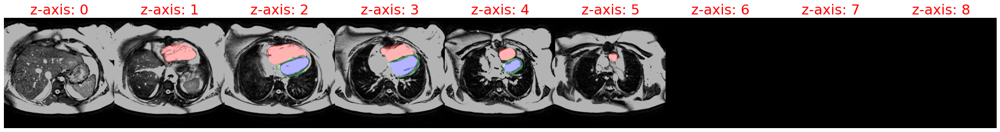

2020-10-16 19:23:22,185 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:22,261 INFO DICE LV: 0.8979860544204712
2020-10-16 19:23:22,337 INFO DICE MYO: 0.5903427004814148
2020-10-16 19:23:22,413 INFO DICE RV: 0.8024462461471558
2020-10-16 19:23:22,465 INFO m: [[ 0.318  -0.944  -0.0938 -0.975 ]
 [ 0.4402  0.0591  0.8965 -0.934 ]
 [-0.84   -0.3264  0.434   5.45  ]]
2020-10-16 19:23:22,466 INFO m_mod: [[ 0.318  -0.944  -0.0938 -0.996 ]
 [ 0.4402  0.0591  0.8965  3.688 ]
 [-0.84   -0.3264  0.434  11.125 ]]
2020-10-16 19:23:22,467 INFO m_scaled: [[ 0.318  -0.944  -0.0938 -3.32  ]
 [ 0.4402  0.0591  0.8965 12.29  ]
 [-0.84   -0.3264  0.434  37.1   ]]
2020-10-16 19:23:22,467 INFO 0000-84R7FQH3_2007-03-16_ES_msk.nrrd
2020-10-16 19:23:22,468 INFO Prediction on AX volume:
2020-10-16 19:23:22,854 INFO AX --> SAX rotated by the model
2020-10-16 19:23:22,854 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:23:22,900 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:22,902 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:25,004 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:25,006 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:25,925 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6e0b2488> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:26,653 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:26,787 INFO DICE RV: 0.7898233532905579
2020-10-16 19:23:26,863 INFO DICE LV: 0.8683450222015381
2020-10-16 1

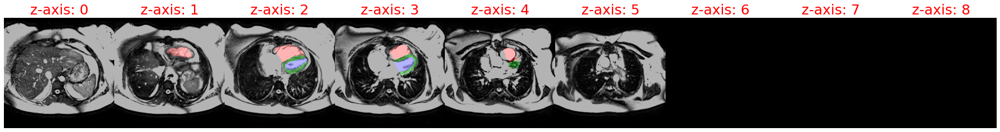

2020-10-16 19:23:27,850 INFO GT on AX


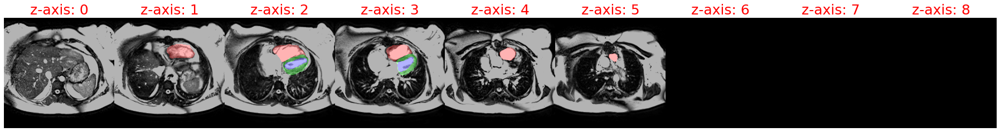

2020-10-16 19:23:28,296 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:28,372 INFO DICE LV: 0.8687199950218201
2020-10-16 19:23:28,446 INFO DICE MYO: 0.7275278568267822
2020-10-16 19:23:28,522 INFO DICE RV: 0.7962254285812378
2020-10-16 19:23:28,573 INFO m: [[ 0.32   -0.9434 -0.0927 -0.973 ]
 [ 0.4395  0.0611  0.8965 -0.929 ]
 [-0.8394 -0.3274  0.4338  5.344 ]]
2020-10-16 19:23:28,573 INFO m_mod: [[ 0.32   -0.9434 -0.0927 -0.9956]
 [ 0.4395  0.0611  0.8965  3.604 ]
 [-0.8394 -0.3274  0.4338 10.89  ]]
2020-10-16 19:23:28,574 INFO m_scaled: [[ 0.32   -0.9434 -0.0927 -3.318 ]
 [ 0.4395  0.0611  0.8965 12.01  ]
 [-0.8394 -0.3274  0.4338 36.28  ]]
2020-10-16 19:23:28,575 INFO 0000-DG1U4JUW_2006-12-22_ED_msk.nrrd
2020-10-16 19:23:28,575 INFO Prediction on AX volume:
2020-10-16 19:23:28,952 INFO AX --> SAX rotated by the model
2020-10-16 19:23:28,953 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:23:28,999 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:29,001 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:31,090 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:31,091 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:32,004 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7fec20750f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:32,754 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:32,885 INFO DICE RV: 0.7270920872688293
2020-10-16 19:23:32,966 INFO DICE LV: 0.9282393455505371
2020-10-16 1

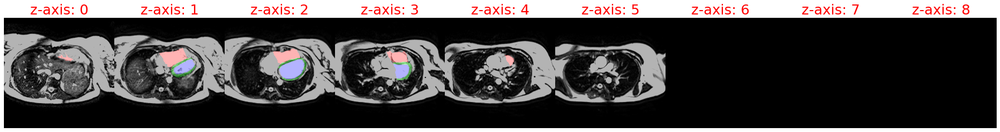

2020-10-16 19:23:33,965 INFO GT on AX


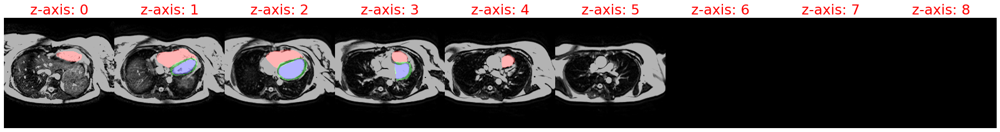

2020-10-16 19:23:34,410 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:34,482 INFO DICE LV: 0.9339876174926758
2020-10-16 19:23:34,555 INFO DICE MYO: 0.6964670419692993
2020-10-16 19:23:34,627 INFO DICE RV: 0.753995418548584
2020-10-16 19:23:34,679 INFO m: [[ 0.3582 -0.9326 -0.0493 -0.9326]
 [ 0.4243  0.1152  0.8984 -0.825 ]
 [-0.832  -0.3425  0.437   4.    ]]
2020-10-16 19:23:34,679 INFO m_mod: [[ 0.3582 -0.9326 -0.0493 -0.98  ]
 [ 0.4243  0.1152  0.8984  2.502 ]
 [-0.832  -0.3425  0.437   7.832 ]]
2020-10-16 19:23:34,680 INFO m_scaled: [[ 0.3582 -0.9326 -0.0493 -3.266 ]
 [ 0.4243  0.1152  0.8984  8.336 ]
 [-0.832  -0.3425  0.437  26.11  ]]
2020-10-16 19:23:34,681 INFO 0000-DG1U4JUW_2006-12-22_ES_msk.nrrd
2020-10-16 19:23:34,681 INFO Prediction on AX volume:
2020-10-16 19:23:35,044 INFO AX --> SAX rotated by the model
2020-10-16 19:23:35,045 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:23:35,091 INFO Target (AX2SAX):
2

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:35,093 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:37,236 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:37,238 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:38,165 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb947be620> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:38,907 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:39,085 INFO DICE RV: 0.6778567433357239
2020-10-16 19:23:39,168 INFO DICE LV: 0.8401787281036377
2020-10-16 1

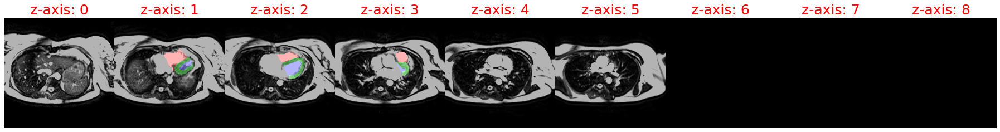

2020-10-16 19:23:40,142 INFO GT on AX


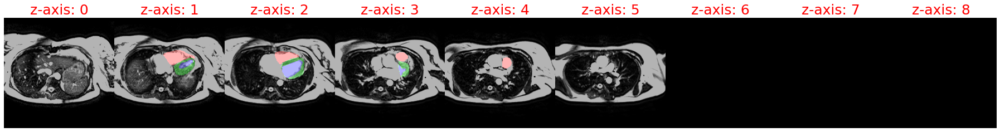

2020-10-16 19:23:40,598 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:40,672 INFO DICE LV: 0.8402208089828491
2020-10-16 19:23:40,745 INFO DICE MYO: 0.7428787350654602
2020-10-16 19:23:40,817 INFO DICE RV: 0.7396976947784424
2020-10-16 19:23:40,871 INFO m: [[ 0.3708  -0.9277  -0.03342 -0.9185 ]
 [ 0.4197   0.1356   0.8975  -0.791  ]
 [-0.828   -0.3467   0.4397   3.725  ]]
2020-10-16 19:23:40,871 INFO m_mod: [[ 0.3708  -0.9277  -0.03342 -0.9727 ]
 [ 0.4197   0.1356   0.8975   2.285  ]
 [-0.828   -0.3467   0.4397   7.215  ]]
2020-10-16 19:23:40,872 INFO m_scaled: [[ 0.3708  -0.9277  -0.03342 -3.242  ]
 [ 0.4197   0.1356   0.8975   7.613  ]
 [-0.828   -0.3467   0.4397  24.05   ]]
2020-10-16 19:23:40,873 INFO 0000-DHQPDW6M_2007-02-16_ED_msk.nrrd
2020-10-16 19:23:40,873 INFO Prediction on AX volume:
2020-10-16 19:23:41,253 INFO AX --> SAX rotated by the model
2020-10-16 19:23:41,255 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:41,324 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:43,440 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:43,442 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:44,367 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb8c1ddd90> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:45,119 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:45,250 INFO DICE RV: 0.7985196113586426
2020-10-16 19:23:45,330 INFO DICE LV: 0.874846875667572
2020-10-16 19

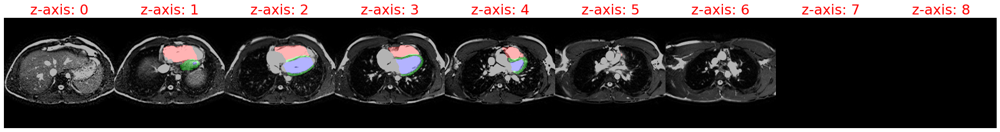

2020-10-16 19:23:46,322 INFO GT on AX


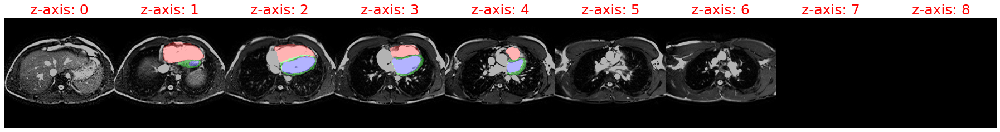

2020-10-16 19:23:46,768 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:46,843 INFO DICE LV: 0.8845788240432739
2020-10-16 19:23:46,918 INFO DICE MYO: 0.6564007997512817
2020-10-16 19:23:46,994 INFO DICE RV: 0.8057894110679626
2020-10-16 19:23:47,046 INFO m: [[ 0.3145  -0.945   -0.09326 -0.9785 ]
 [ 0.4421   0.05856  0.895   -0.944  ]
 [-0.8403  -0.3225   0.436    5.67   ]]
2020-10-16 19:23:47,046 INFO m_mod: [[ 0.3145  -0.945   -0.09326 -0.997  ]
 [ 0.4421   0.05856  0.895    3.857  ]
 [-0.8403  -0.3225   0.436   11.67   ]]
2020-10-16 19:23:47,047 INFO m_scaled: [[ 0.3145  -0.945   -0.09326 -3.322  ]
 [ 0.4421   0.05856  0.895   12.85   ]
 [-0.8403  -0.3225   0.436   38.9    ]]
2020-10-16 19:23:47,048 INFO 0000-DHQPDW6M_2007-02-16_ES_msk.nrrd
2020-10-16 19:23:47,048 INFO Prediction on AX volume:
2020-10-16 19:23:47,438 INFO AX --> SAX rotated by the model
2020-10-16 19:23:47,439 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:47,500 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:49,609 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:49,611 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:51,547 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7fec39ce4950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:52,298 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:52,427 INFO DICE RV: 0.7165398001670837
2020-10-16 19:23:52,508 INFO DICE LV: 0.8101561665534973
2020-10-16 1

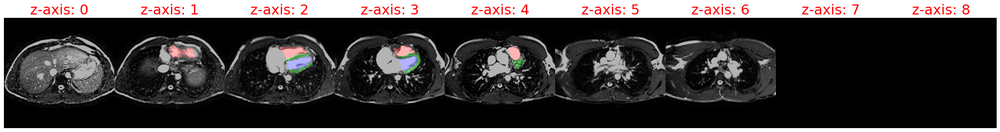

2020-10-16 19:23:53,498 INFO GT on AX


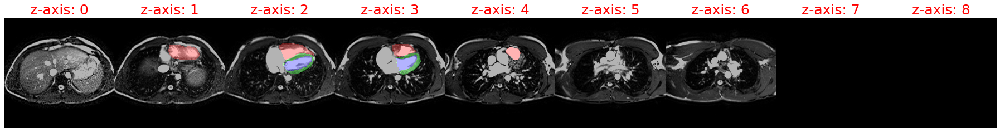

2020-10-16 19:23:53,945 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:23:54,021 INFO DICE LV: 0.8192417025566101
2020-10-16 19:23:54,096 INFO DICE MYO: 0.691641628742218
2020-10-16 19:23:54,171 INFO DICE RV: 0.7265772819519043
2020-10-16 19:23:54,222 INFO m: [[ 0.3228  -0.9424  -0.08594 -0.9697 ]
 [ 0.4377   0.0683   0.896   -0.921  ]
 [-0.839   -0.327    0.4348   5.164  ]]
2020-10-16 19:23:54,223 INFO m_mod: [[ 0.3228  -0.9424  -0.08594 -0.9946 ]
 [ 0.4377   0.0683   0.896    3.447  ]
 [-0.839   -0.327    0.4348  10.51   ]]
2020-10-16 19:23:54,223 INFO m_scaled: [[ 0.3228  -0.9424  -0.08594 -3.314  ]
 [ 0.4377   0.0683   0.896   11.49   ]
 [-0.839   -0.327    0.4348  35.03   ]]
2020-10-16 19:23:54,224 INFO 0000-E4YTNGAZ_2006-11-07_ED_msk.nrrd
2020-10-16 19:23:54,224 INFO Prediction on AX volume:
2020-10-16 19:23:54,607 INFO AX --> SAX rotated by the model
2020-10-16 19:23:54,607 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:54,707 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:23:56,831 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:56,833 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:23:57,765 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6153d950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:23:58,511 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:23:58,648 INFO DICE RV: 0.7959564924240112
2020-10-16 19:23:58,726 INFO DICE LV: 0.9272820353507996
2020-10-16 1

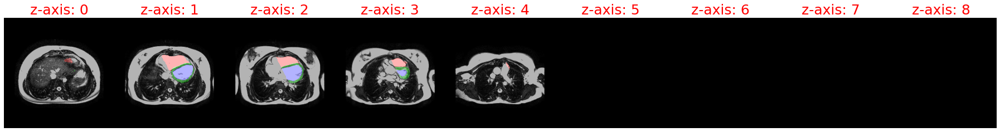

2020-10-16 19:23:59,696 INFO GT on AX


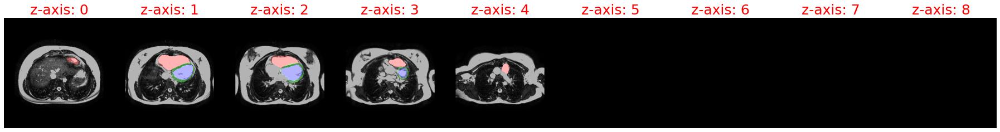

2020-10-16 19:24:00,125 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:00,208 INFO DICE LV: 0.9272904992103577
2020-10-16 19:24:00,288 INFO DICE MYO: 0.6632863879203796
2020-10-16 19:24:00,363 INFO DICE RV: 0.7955619096755981
2020-10-16 19:24:00,415 INFO m: [[ 0.3645 -0.9307 -0.0432 -0.924 ]
 [ 0.4214  0.1231  0.899  -0.8013]
 [-0.8306 -0.3457  0.4368  3.81  ]]
2020-10-16 19:24:00,415 INFO m_mod: [[ 0.3645 -0.9307 -0.0432 -0.978 ]
 [ 0.4214  0.1231  0.899   2.344 ]
 [-0.8306 -0.3457  0.4368  7.414 ]]
2020-10-16 19:24:00,416 INFO m_scaled: [[ 0.3645 -0.9307 -0.0432 -3.26  ]
 [ 0.4214  0.1231  0.899   7.812 ]
 [-0.8306 -0.3457  0.4368 24.7   ]]
2020-10-16 19:24:00,416 INFO 0000-E4YTNGAZ_2006-11-07_ES_msk.nrrd
2020-10-16 19:24:00,417 INFO Prediction on AX volume:
2020-10-16 19:24:00,777 INFO AX --> SAX rotated by the model
2020-10-16 19:24:00,778 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:24:00,829 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:00,831 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:02,928 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:02,930 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:03,854 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6ba23598> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:04,614 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:04,748 INFO DICE RV: 0.7803316116333008
2020-10-16 19:24:04,824 INFO DICE LV: 0.8953862190246582
2020-10-16 1

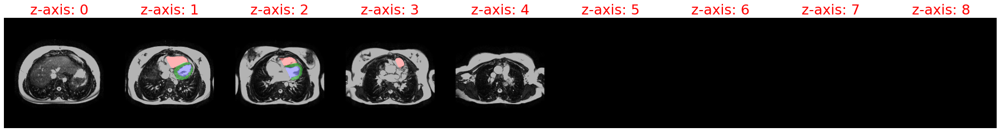

2020-10-16 19:24:05,765 INFO GT on AX


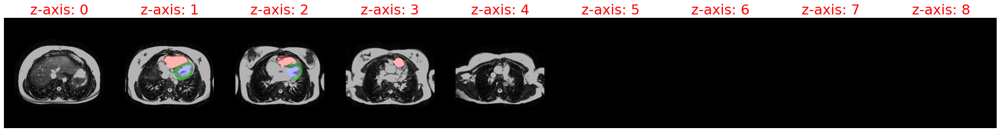

2020-10-16 19:24:06,198 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:06,281 INFO DICE LV: 0.8953106999397278
2020-10-16 19:24:06,362 INFO DICE MYO: 0.718280553817749
2020-10-16 19:24:06,437 INFO DICE RV: 0.7746276259422302
2020-10-16 19:24:06,489 INFO m: [[ 0.3674  -0.9287  -0.03958 -0.921  ]
 [ 0.42     0.1282   0.898   -0.7935 ]
 [-0.8296  -0.3467   0.4375   3.752  ]]
2020-10-16 19:24:06,489 INFO m_mod: [[ 0.3674  -0.9287  -0.03958 -0.976  ]
 [ 0.42     0.1282   0.898    2.297  ]
 [-0.8296  -0.3467   0.4375   7.28   ]]
2020-10-16 19:24:06,490 INFO m_scaled: [[ 0.3674  -0.9287  -0.03958 -3.252  ]
 [ 0.42     0.1282   0.898    7.656  ]
 [-0.8296  -0.3467   0.4375  24.27   ]]
2020-10-16 19:24:06,491 INFO 0000-ER5Q2EXD_2007-02-22_ED_msk.nrrd
2020-10-16 19:24:06,491 INFO Prediction on AX volume:
2020-10-16 19:24:06,885 INFO AX --> SAX rotated by the model
2020-10-16 19:24:06,886 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:06,938 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:09,048 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:09,050 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:09,991 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb77f7e950> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:10,751 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:10,889 INFO DICE RV: 0.8060507774353027
2020-10-16 19:24:10,966 INFO DICE LV: 0.8638920187950134
2020-10-16 1

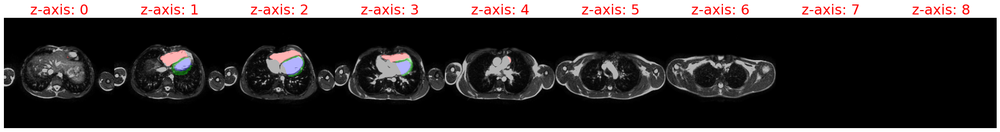

2020-10-16 19:24:11,935 INFO GT on AX


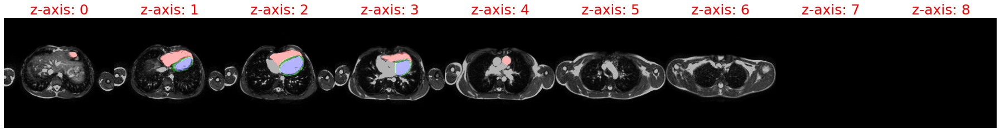

2020-10-16 19:24:12,377 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:12,459 INFO DICE LV: 0.8652845621109009
2020-10-16 19:24:12,534 INFO DICE MYO: 0.48644164204597473
2020-10-16 19:24:12,610 INFO DICE RV: 0.8290715217590332
2020-10-16 19:24:12,662 INFO m: [[ 0.4177  -0.908    0.02292 -0.871  ]
 [ 0.406    0.2096   0.8896  -0.672  ]
 [-0.8125  -0.3623   0.4563   3.033  ]]
2020-10-16 19:24:12,662 INFO m_mod: [[ 0.4177  -0.908    0.02292 -0.943  ]
 [ 0.406    0.2096   0.8896   1.73   ]
 [-0.8125  -0.3623   0.4563   5.688  ]]
2020-10-16 19:24:12,663 INFO m_scaled: [[ 0.4177  -0.908    0.02292 -3.143  ]
 [ 0.406    0.2096   0.8896   5.77   ]
 [-0.8125  -0.3623   0.4563  18.95   ]]
2020-10-16 19:24:12,663 INFO 0000-ER5Q2EXD_2007-02-22_ES_msk.nrrd
2020-10-16 19:24:12,663 INFO Prediction on AX volume:
2020-10-16 19:24:13,032 INFO AX --> SAX rotated by the model
2020-10-16 19:24:13,032 INFO AX --> SAX with modified m rotated by the model
2020-10-1

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:13,081 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:15,186 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:15,188 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:16,115 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6ae22f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:16,858 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:16,988 INFO DICE RV: 0.6288320422172546
2020-10-16 19:24:17,076 INFO DICE LV: 0.8510242104530334
2020-10-16 1

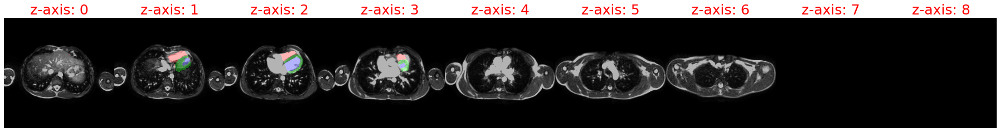

2020-10-16 19:24:18,032 INFO GT on AX


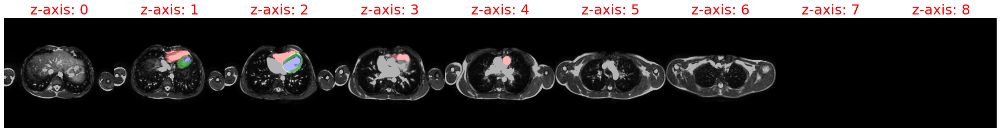

2020-10-16 19:24:18,471 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:18,551 INFO DICE LV: 0.8508273959159851
2020-10-16 19:24:18,627 INFO DICE MYO: 0.6222389936447144
2020-10-16 19:24:18,702 INFO DICE RV: 0.6149815917015076
2020-10-16 19:24:18,754 INFO m: [[ 0.415   -0.91     0.01929 -0.8735 ]
 [ 0.4067   0.2042   0.891   -0.6787 ]
 [-0.814   -0.3618   0.4548   3.064  ]]
2020-10-16 19:24:18,754 INFO m_mod: [[ 0.415   -0.91     0.01929 -0.945  ]
 [ 0.4067   0.2042   0.891    1.754  ]
 [-0.814   -0.3618   0.4548   5.758  ]]
2020-10-16 19:24:18,755 INFO m_scaled: [[ 0.415   -0.91     0.01929 -3.148  ]
 [ 0.4067   0.2042   0.891    5.844  ]
 [-0.814   -0.3618   0.4548  19.19   ]]
2020-10-16 19:24:18,756 INFO 0000-F0QP6ZJR_2006-01-01_ED_msk.nrrd
2020-10-16 19:24:18,756 INFO Prediction on AX volume:
2020-10-16 19:24:19,143 INFO AX --> SAX rotated by the model
2020-10-16 19:24:19,143 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:19,192 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:21,287 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:21,289 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:22,235 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb9c4e3840> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:22,993 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:23,123 INFO DICE RV: 0.8025829195976257
2020-10-16 19:24:23,206 INFO DICE LV: 0.9285292625427246
2020-10-16 1

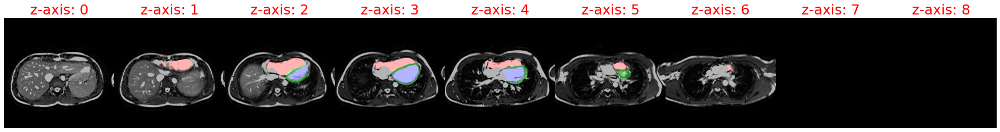

2020-10-16 19:24:24,169 INFO GT on AX


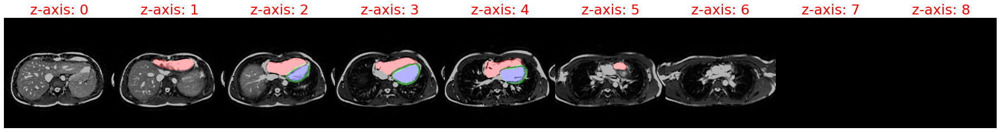

2020-10-16 19:24:24,623 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:24,706 INFO DICE LV: 0.929106593132019
2020-10-16 19:24:24,784 INFO DICE MYO: 0.7271381616592407
2020-10-16 19:24:24,860 INFO DICE RV: 0.8114195466041565
2020-10-16 19:24:24,912 INFO m: [[ 0.3281  -0.9414  -0.08105 -0.964  ]
 [ 0.4358   0.0745   0.8975  -0.9053 ]
 [-0.8384  -0.3296   0.4346   4.9    ]]
2020-10-16 19:24:24,913 INFO m_mod: [[ 0.3281  -0.9414  -0.08105 -0.993  ]
 [ 0.4358   0.0745   0.8975   3.232  ]
 [-0.8384  -0.3296   0.4346   9.92   ]]
2020-10-16 19:24:24,913 INFO m_scaled: [[ 0.3281  -0.9414  -0.08105 -3.31   ]
 [ 0.4358   0.0745   0.8975  10.77   ]
 [-0.8384  -0.3296   0.4346  33.1    ]]
2020-10-16 19:24:24,914 INFO 0000-F0QP6ZJR_2006-01-01_ES_msk.nrrd
2020-10-16 19:24:24,914 INFO Prediction on AX volume:
2020-10-16 19:24:25,283 INFO AX --> SAX rotated by the model
2020-10-16 19:24:25,283 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:25,333 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:27,464 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:27,465 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:28,395 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb96ad9f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:29,149 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:29,290 INFO DICE RV: 0.7321270704269409
2020-10-16 19:24:29,366 INFO DICE LV: 0.8684083223342896
2020-10-16 1

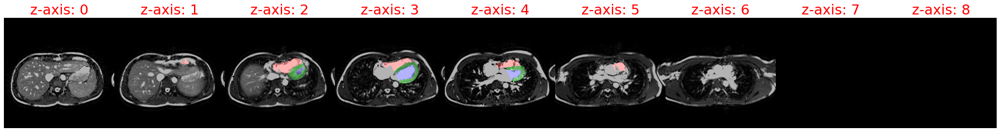

2020-10-16 19:24:30,332 INFO GT on AX


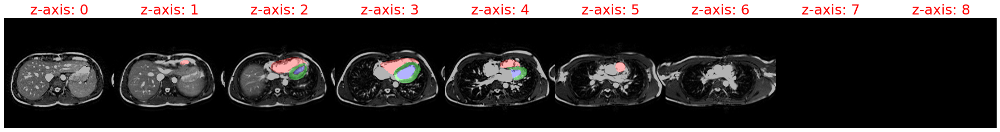

2020-10-16 19:24:30,793 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:30,874 INFO DICE LV: 0.866381049156189
2020-10-16 19:24:30,950 INFO DICE MYO: 0.7429277300834656
2020-10-16 19:24:31,026 INFO DICE RV: 0.7450370192527771
2020-10-16 19:24:31,077 INFO m: [[ 0.333   -0.94    -0.0754  -0.9585 ]
 [ 0.4336   0.08167  0.8975  -0.8926 ]
 [-0.8374  -0.3315   0.435    4.707  ]]
2020-10-16 19:24:31,078 INFO m_mod: [[ 0.333   -0.94    -0.0754  -0.9917 ]
 [ 0.4336   0.08167  0.8975   3.078  ]
 [-0.8374  -0.3315   0.435    9.484  ]]
2020-10-16 19:24:31,078 INFO m_scaled: [[ 0.333   -0.94    -0.0754  -3.305  ]
 [ 0.4336   0.08167  0.8975  10.26   ]
 [-0.8374  -0.3315   0.435   31.62   ]]
2020-10-16 19:24:31,079 INFO 0000-JERK6VC0_2006-01-19_ED_msk.nrrd
2020-10-16 19:24:31,079 INFO Prediction on AX volume:
2020-10-16 19:24:31,462 INFO AX --> SAX rotated by the model
2020-10-16 19:24:31,462 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:31,510 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:33,645 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:33,647 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:34,574 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb68b456a8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:35,328 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:35,468 INFO DICE RV: 0.577499270439148
2020-10-16 19:24:35,544 INFO DICE LV: 0.3456924259662628
2020-10-16 19

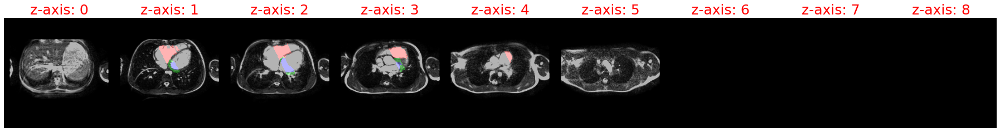

2020-10-16 19:24:36,569 INFO GT on AX


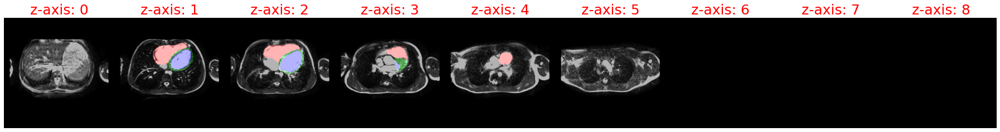

2020-10-16 19:24:37,020 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:37,112 INFO DICE LV: 0.36778295040130615
2020-10-16 19:24:37,186 INFO DICE MYO: 0.2824040353298187
2020-10-16 19:24:37,262 INFO DICE RV: 0.611011266708374
2020-10-16 19:24:37,313 INFO m: [[ 0.4714 -0.8774  0.0842 -0.817 ]
 [ 0.3923  0.2942  0.871  -0.551 ]
 [-0.79   -0.3777  0.483   2.53  ]]
2020-10-16 19:24:37,314 INFO m_mod: [[ 0.4714 -0.8774  0.0842 -0.9004]
 [ 0.3923  0.2942  0.871   1.339 ]
 [-0.79   -0.3777  0.483   4.555 ]]
2020-10-16 19:24:37,314 INFO m_scaled: [[ 0.4714 -0.8774  0.0842 -3.    ]
 [ 0.3923  0.2942  0.871   4.465 ]
 [-0.79   -0.3777  0.483  15.19  ]]
2020-10-16 19:24:37,316 INFO 0000-JERK6VC0_2006-01-19_ES_msk.nrrd
2020-10-16 19:24:37,317 INFO Prediction on AX volume:
2020-10-16 19:24:37,701 INFO AX --> SAX rotated by the model
2020-10-16 19:24:37,702 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:24:37,752 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:37,754 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:39,908 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:39,909 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:41,887 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb5a220f28> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:42,632 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:42,763 INFO DICE RV: 0.683210551738739
2020-10-16 19:24:42,854 INFO DICE LV: 0.6377815008163452
2020-10-16 19

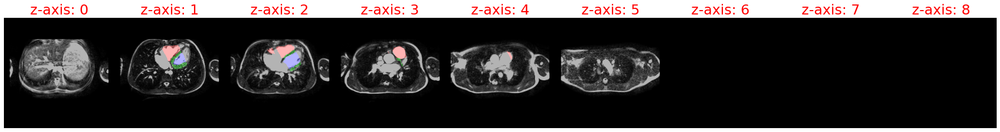

2020-10-16 19:24:43,805 INFO GT on AX


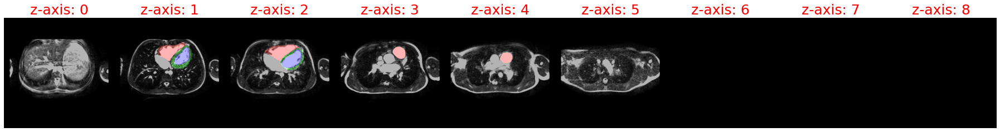

2020-10-16 19:24:46,444 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:46,504 INFO DICE LV: 0.6981469392776489
2020-10-16 19:24:46,563 INFO DICE MYO: 0.426758348941803
2020-10-16 19:24:46,621 INFO DICE RV: 0.7048941850662231
2020-10-16 19:24:46,659 INFO m: [[ 0.4602  -0.885    0.07227 -0.827  ]
 [ 0.395    0.277    0.876   -0.575  ]
 [-0.795   -0.3745   0.477    2.615  ]]
2020-10-16 19:24:46,659 INFO m_mod: [[ 0.4602  -0.885    0.07227 -0.9097 ]
 [ 0.395    0.277    0.876    1.408  ]
 [-0.795   -0.3745   0.477    4.75   ]]
2020-10-16 19:24:46,660 INFO m_scaled: [[ 0.4602  -0.885    0.07227 -3.031  ]
 [ 0.395    0.277    0.876    4.69   ]
 [-0.795   -0.3745   0.477   15.836  ]]
2020-10-16 19:24:46,661 INFO 0000-K5T17122_2005-08-25_ED_msk.nrrd
2020-10-16 19:24:46,661 INFO Prediction on AX volume:
2020-10-16 19:24:47,044 INFO AX --> SAX rotated by the model
2020-10-16 19:24:47,045 INFO AX --> SAX with modified m rotated by the model
2020-10-16 

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:47,100 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:49,307 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:49,309 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:50,310 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb6adf2378> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:51,062 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:51,184 INFO DICE RV: 0.5397422909736633
2020-10-16 19:24:51,256 INFO DICE LV: 0.8819615244865417
2020-10-16 1

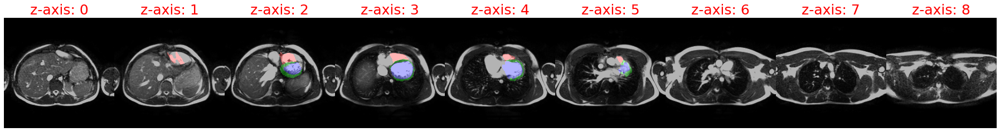

2020-10-16 19:24:52,225 INFO GT on AX


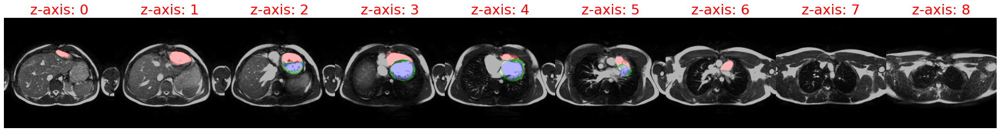

2020-10-16 19:24:52,686 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:52,753 INFO DICE LV: 0.8850446939468384
2020-10-16 19:24:52,822 INFO DICE MYO: 0.5252901315689087
2020-10-16 19:24:52,889 INFO DICE RV: 0.5890682339668274
2020-10-16 19:24:52,926 INFO m: [[ 0.3508  -0.935   -0.056   -0.94   ]
 [ 0.4265   0.10626  0.8984  -0.8438 ]
 [-0.8335  -0.3389   0.436    4.16   ]]
2020-10-16 19:24:52,927 INFO m_mod: [[ 0.3508  -0.935   -0.056   -0.984  ]
 [ 0.4265   0.10626  0.8984   2.63   ]
 [-0.8335  -0.3389   0.436    8.23   ]]
2020-10-16 19:24:52,927 INFO m_scaled: [[ 0.3508  -0.935   -0.056   -3.28   ]
 [ 0.4265   0.10626  0.8984   8.77   ]
 [-0.8335  -0.3389   0.436   27.42   ]]
2020-10-16 19:24:52,928 INFO 0000-K5T17122_2005-08-25_ES_msk.nrrd
2020-10-16 19:24:52,928 INFO Prediction on AX volume:
2020-10-16 19:24:53,314 INFO AX --> SAX rotated by the model
2020-10-16 19:24:53,315 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:53,364 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:24:55,516 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:55,517 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:56,474 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb72b001e0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:24:57,220 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:24:57,342 INFO DICE RV: 0.4946920871734619
2020-10-16 19:24:57,410 INFO DICE LV: 0.7266773581504822
2020-10-16 1

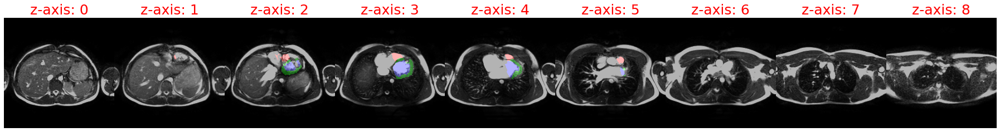

2020-10-16 19:24:58,400 INFO GT on AX


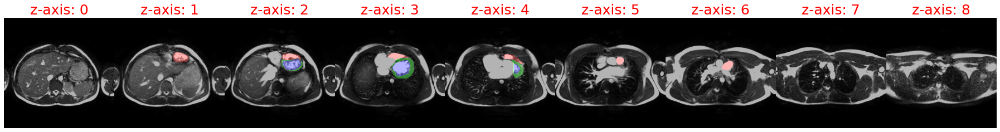

2020-10-16 19:24:58,869 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:24:58,937 INFO DICE LV: 0.7401494979858398
2020-10-16 19:24:59,000 INFO DICE MYO: 0.5604814291000366
2020-10-16 19:24:59,064 INFO DICE RV: 0.4893943667411804
2020-10-16 19:24:59,101 INFO m: [[ 0.3547  -0.9336  -0.05145 -0.936  ]
 [ 0.4253   0.1121   0.8984  -0.833  ]
 [-0.8325  -0.3403   0.4365   4.066  ]]
2020-10-16 19:24:59,102 INFO m_mod: [[ 0.3547  -0.9336  -0.05145 -0.982  ]
 [ 0.4253   0.1121   0.8984   2.557  ]
 [-0.8325  -0.3403   0.4365   8.01   ]]
2020-10-16 19:24:59,102 INFO m_scaled: [[ 0.3547  -0.9336  -0.05145 -3.273  ]
 [ 0.4253   0.1121   0.8984   8.52   ]
 [-0.8325  -0.3403   0.4365  26.69   ]]
2020-10-16 19:24:59,103 INFO 0000-KHQNN842_2006-01-01_ED_msk.nrrd
2020-10-16 19:24:59,103 INFO Prediction on AX volume:
2020-10-16 19:24:59,467 INFO AX --> SAX rotated by the model
2020-10-16 19:24:59,468 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:24:59,517 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:01,636 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:01,638 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:02,581 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb60b52620> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:03,316 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:03,437 INFO DICE RV: 0.8531656861305237
2020-10-16 19:25:03,505 INFO DICE LV: 0.8925004005432129
2020-10-16 1

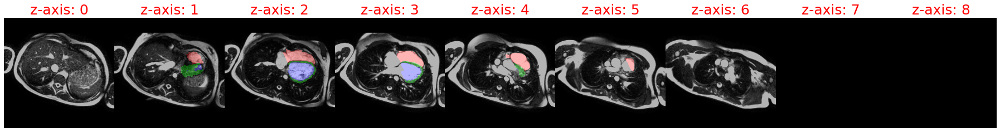

2020-10-16 19:25:04,456 INFO GT on AX


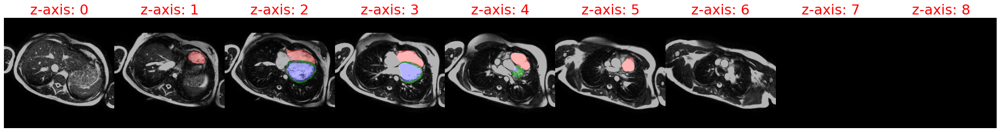

2020-10-16 19:25:04,904 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:04,973 INFO DICE LV: 0.8998348116874695
2020-10-16 19:25:05,040 INFO DICE MYO: 0.5499874353408813
2020-10-16 19:25:05,108 INFO DICE RV: 0.8519902229309082
2020-10-16 19:25:05,145 INFO m: [[ 0.313  -0.945  -0.0934 -0.98  ]
 [ 0.4429  0.0581  0.8945 -0.9478]
 [-0.8403 -0.3215  0.4368  5.79  ]]
2020-10-16 19:25:05,145 INFO m_mod: [[ 0.313  -0.945  -0.0934 -0.9976]
 [ 0.4429  0.0581  0.8945  3.951 ]
 [-0.8403 -0.3215  0.4368 11.93  ]]
2020-10-16 19:25:05,146 INFO m_scaled: [[ 0.313  -0.945  -0.0934 -3.326 ]
 [ 0.4429  0.0581  0.8945 13.164 ]
 [-0.8403 -0.3215  0.4368 39.78  ]]
2020-10-16 19:25:05,146 INFO 0000-KHQNN842_2006-01-01_ES_msk.nrrd
2020-10-16 19:25:05,147 INFO Prediction on AX volume:
2020-10-16 19:25:05,509 INFO AX --> SAX rotated by the model
2020-10-16 19:25:05,509 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:25:05,560 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:05,561 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:07,688 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:07,690 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:08,641 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7fec39f4d510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:09,374 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:09,494 INFO DICE RV: 0.8080703616142273
2020-10-16 19:25:09,562 INFO DICE LV: 0.8509078025817871
2020-10-16 1

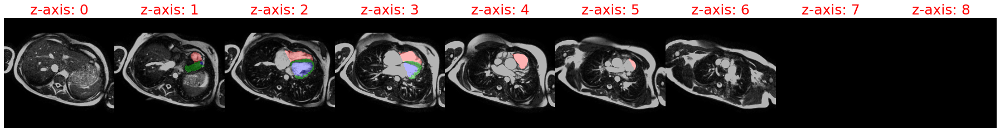

2020-10-16 19:25:10,504 INFO GT on AX


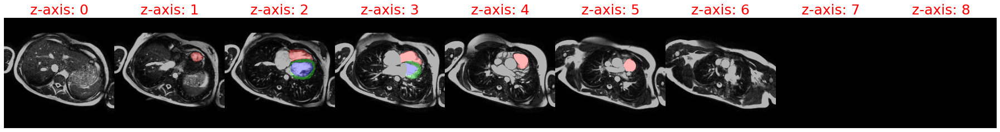

2020-10-16 19:25:10,949 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:11,015 INFO DICE LV: 0.8564934134483337
2020-10-16 19:25:11,079 INFO DICE MYO: 0.6891850233078003
2020-10-16 19:25:11,142 INFO DICE RV: 0.8053633570671082
2020-10-16 19:25:11,182 INFO m: [[ 0.311  -0.9463 -0.095  -0.9824]
 [ 0.444   0.0562  0.8945 -0.953 ]
 [-0.8403 -0.3203  0.4375  5.957 ]]
2020-10-16 19:25:11,182 INFO m_mod: [[ 0.311  -0.9463 -0.095  -0.998 ]
 [ 0.444   0.0562  0.8945  4.094 ]
 [-0.8403 -0.3203  0.4375 12.31  ]]
2020-10-16 19:25:11,183 INFO m_scaled: [[ 0.311  -0.9463 -0.095  -3.328 ]
 [ 0.444   0.0562  0.8945 13.65  ]
 [-0.8403 -0.3203  0.4375 41.03  ]]
2020-10-16 19:25:11,183 INFO 0000-LLLNJLF6_2006-09-27_ED_msk.nrrd
2020-10-16 19:25:11,184 INFO Prediction on AX volume:
2020-10-16 19:25:11,548 INFO AX --> SAX rotated by the model
2020-10-16 19:25:11,548 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:25:11,595 INFO Target (AX2SAX):


(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:11,597 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:13,691 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:13,692 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:15,617 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb94068e18> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:16,355 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:16,478 INFO DICE RV: 0.4457261562347412
2020-10-16 19:25:16,546 INFO DICE LV: 0.5712053775787354
2020-10-16 1

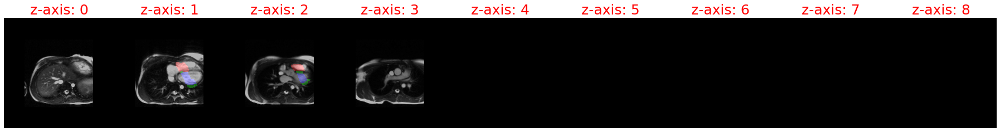

2020-10-16 19:25:17,451 INFO GT on AX


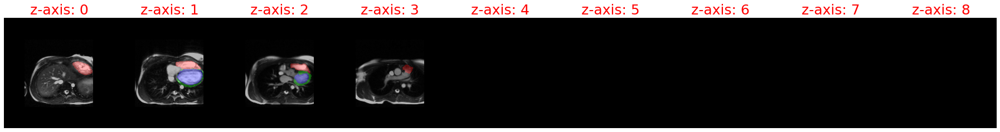

2020-10-16 19:25:17,879 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:17,946 INFO DICE LV: 0.5869858264923096
2020-10-16 19:25:18,014 INFO DICE MYO: 0.29984432458877563
2020-10-16 19:25:18,081 INFO DICE RV: 0.4868229329586029
2020-10-16 19:25:18,117 INFO m: [[ 0.5293 -0.8354  0.1458 -0.7603]
 [ 0.379   0.387   0.8403 -0.434 ]
 [-0.759  -0.3896  0.521   2.12  ]]
2020-10-16 19:25:18,118 INFO m_mod: [[ 0.5293 -0.8354  0.1458 -0.8516]
 [ 0.379   0.387   0.8403  1.037 ]
 [-0.759  -0.3896  0.521   3.725 ]]
2020-10-16 19:25:18,119 INFO m_scaled: [[ 0.5293 -0.8354  0.1458 -2.838 ]
 [ 0.379   0.387   0.8403  3.459 ]
 [-0.759  -0.3896  0.521  12.414 ]]
2020-10-16 19:25:18,119 INFO 0000-LLLNJLF6_2006-09-27_ES_msk.nrrd
2020-10-16 19:25:18,119 INFO Prediction on AX volume:
2020-10-16 19:25:18,503 INFO AX --> SAX rotated by the model
2020-10-16 19:25:18,503 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:25:18,556 INFO Target (AX2SAX):

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:18,558 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:21,695 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:21,697 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:22,625 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb97ffb510> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:23,359 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:23,479 INFO DICE RV: 0.5381000638008118
2020-10-16 19:25:23,547 INFO DICE LV: 0.5430147051811218
2020-10-16 1

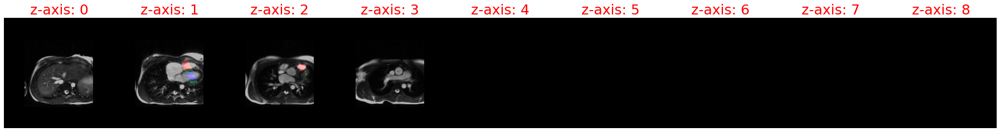

2020-10-16 19:25:24,472 INFO GT on AX


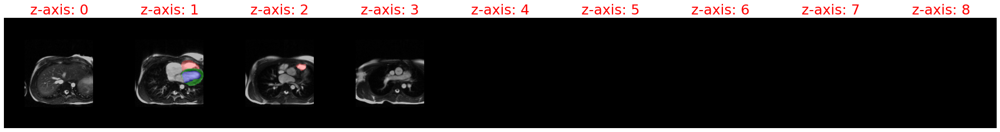

2020-10-16 19:25:24,902 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:24,971 INFO DICE LV: 0.5222963094711304
2020-10-16 19:25:25,039 INFO DICE MYO: 0.32642364501953125
2020-10-16 19:25:25,108 INFO DICE RV: 0.5389605164527893
2020-10-16 19:25:25,145 INFO m: [[ 0.532  -0.8335  0.1492 -0.758 ]
 [ 0.3782  0.3916  0.839  -0.4287]
 [-0.7573 -0.3901  0.5234  2.102 ]]
2020-10-16 19:25:25,145 INFO m_mod: [[ 0.532  -0.8335  0.1492 -0.849 ]
 [ 0.3782  0.3916  0.839   1.024 ]
 [-0.7573 -0.3901  0.5234  3.686 ]]
2020-10-16 19:25:25,146 INFO m_scaled: [[ 0.532  -0.8335  0.1492 -2.83  ]
 [ 0.3782  0.3916  0.839   3.414 ]
 [-0.7573 -0.3901  0.5234 12.28  ]]
2020-10-16 19:25:25,146 INFO 0000-LV70LENY_2007-03-12_ED_msk.nrrd
2020-10-16 19:25:25,147 INFO Prediction on AX volume:
2020-10-16 19:25:25,533 INFO AX --> SAX rotated by the model
2020-10-16 19:25:25,534 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:25:25,583 INFO Target (AX2SAX):

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:25,585 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:27,705 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:27,707 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:28,644 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb62c8be18> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:29,380 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:29,503 INFO DICE RV: 0.8137211203575134
2020-10-16 19:25:29,572 INFO DICE LV: 0.8562091588973999
2020-10-16 1

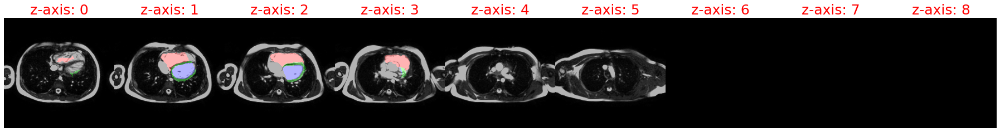

2020-10-16 19:25:30,514 INFO GT on AX


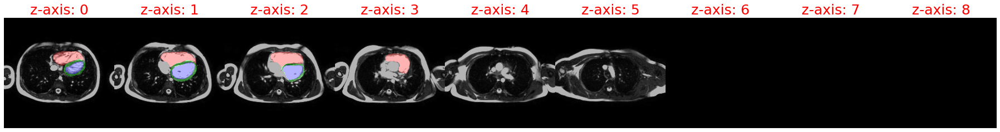

2020-10-16 19:25:30,953 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:31,019 INFO DICE LV: 0.8569661974906921
2020-10-16 19:25:31,084 INFO DICE MYO: 0.625137448310852
2020-10-16 19:25:31,149 INFO DICE RV: 0.822996973991394
2020-10-16 19:25:31,187 INFO m: [[ 0.4443 -0.8945  0.0521 -0.844 ]
 [ 0.399   0.2495  0.883  -0.607 ]
 [-0.8022 -0.3716  0.4678  2.754 ]]
2020-10-16 19:25:31,187 INFO m_mod: [[ 0.4443 -0.8945  0.0521 -0.923 ]
 [ 0.399   0.2495  0.883   1.511 ]
 [-0.8022 -0.3716  0.4678  5.07  ]]
2020-10-16 19:25:31,188 INFO m_scaled: [[ 0.4443 -0.8945  0.0521 -3.076 ]
 [ 0.399   0.2495  0.883   5.035 ]
 [-0.8022 -0.3716  0.4678 16.89  ]]
2020-10-16 19:25:31,189 INFO 0000-LV70LENY_2007-03-12_ES_msk.nrrd
2020-10-16 19:25:31,189 INFO Prediction on AX volume:
2020-10-16 19:25:31,568 INFO AX --> SAX rotated by the model
2020-10-16 19:25:31,569 INFO AX --> SAX with modified m rotated by the model
2020-10-16 19:25:31,630 INFO Target (AX2SAX):
20

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:31,632 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:33,745 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:33,747 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:34,664 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb8c770730> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:35,403 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:35,525 INFO DICE RV: 0.7847822308540344
2020-10-16 19:25:35,593 INFO DICE LV: 0.8077219724655151
2020-10-16 1

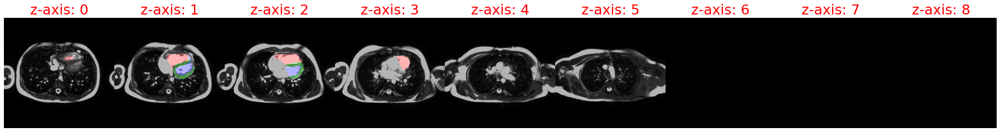

2020-10-16 19:25:36,513 INFO GT on AX


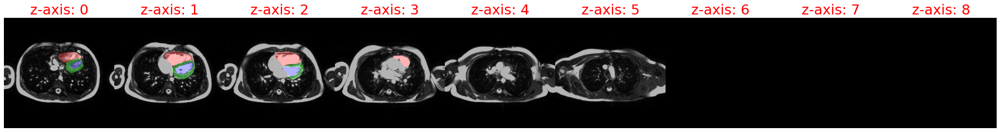

2020-10-16 19:25:36,954 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:37,019 INFO DICE LV: 0.8062475323677063
2020-10-16 19:25:37,083 INFO DICE MYO: 0.7047359943389893
2020-10-16 19:25:37,147 INFO DICE RV: 0.7916305661201477
2020-10-16 19:25:37,186 INFO m: [[ 0.4412  -0.896    0.04788 -0.8477 ]
 [ 0.4      0.2441   0.8833  -0.6133 ]
 [-0.803   -0.3708   0.4663   2.785  ]]
2020-10-16 19:25:37,186 INFO m_mod: [[ 0.4412  -0.896    0.04788 -0.926  ]
 [ 0.4      0.2441   0.8833   1.535  ]
 [-0.803   -0.3708   0.4663   5.137  ]]
2020-10-16 19:25:37,187 INFO m_scaled: [[ 0.4412  -0.896    0.04788 -3.086  ]
 [ 0.4      0.2441   0.8833   5.117  ]
 [-0.803   -0.3708   0.4663  17.12   ]]
2020-10-16 19:25:37,187 INFO 0000-MA4HVCMK_2006-06-22_ED_msk.nrrd
2020-10-16 19:25:37,188 INFO Prediction on AX volume:
2020-10-16 19:25:37,571 INFO AX --> SAX rotated by the model
2020-10-16 19:25:37,572 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:37,620 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:39,742 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:39,744 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:40,665 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb9c1bfbf8> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:41,409 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:41,530 INFO DICE RV: 0.8825151324272156
2020-10-16 19:25:41,597 INFO DICE LV: 0.9232132434844971
2020-10-16 1

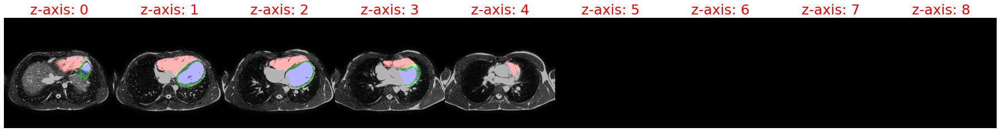

2020-10-16 19:25:42,532 INFO GT on AX


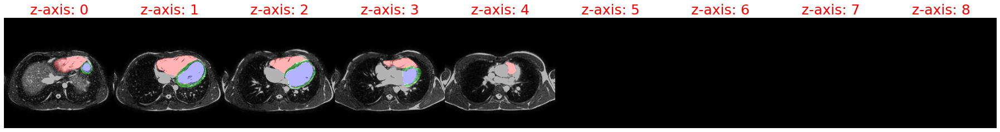

2020-10-16 19:25:42,968 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:43,036 INFO DICE LV: 0.9228821396827698
2020-10-16 19:25:43,105 INFO DICE MYO: 0.6861539483070374
2020-10-16 19:25:43,174 INFO DICE RV: 0.8944194316864014
2020-10-16 19:25:43,212 INFO m: [[ 0.3188  -0.9434  -0.09125 -0.973  ]
 [ 0.4392   0.0617   0.8965  -0.9287 ]
 [-0.84    -0.3262   0.4343   5.34   ]]
2020-10-16 19:25:43,212 INFO m_mod: [[ 0.3188  -0.9434  -0.09125 -0.996  ]
 [ 0.4392   0.0617   0.8965   3.578  ]
 [-0.84    -0.3262   0.4343  10.91   ]]
2020-10-16 19:25:43,213 INFO m_scaled: [[ 0.3188  -0.9434  -0.09125 -3.32   ]
 [ 0.4392   0.0617   0.8965  11.93   ]
 [-0.84    -0.3262   0.4343  36.34   ]]
2020-10-16 19:25:43,213 INFO 0000-MA4HVCMK_2006-06-22_ES_msk.nrrd
2020-10-16 19:25:43,214 INFO Prediction on AX volume:
2020-10-16 19:25:43,607 INFO AX --> SAX rotated by the model
2020-10-16 19:25:43,608 INFO AX --> SAX with modified m rotated by the model
2020-10-16

(3, 4)
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:43,675 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
2020-10-16 19:25:46,838 INFO Predicted mask


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:46,840 INFO Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2020-10-16 19:25:47,754 WARNING 5 out of the last 15 calls to <function Model.make_predict_function.<locals>.predict_function at 0x7feb9d327620> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/tutorials/customization/performance#python_or_tensor_args and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2020-10-16 19:25:48,493 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-10-16 19:25:48,613 INFO DICE RV: 0.7942555546760559
2020-10-16 19:25:48,679 INFO DICE LV: 0.8734747171401978
2020-10-16 1

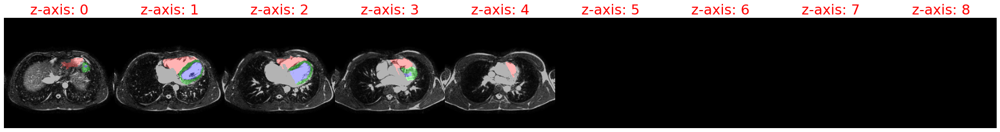

2020-10-16 19:25:49,656 INFO GT on AX


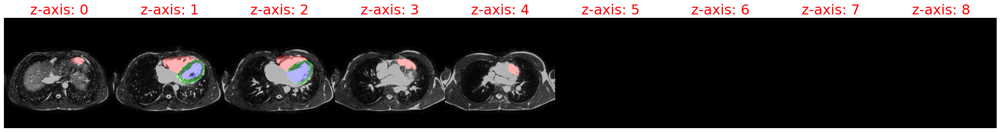

2020-10-16 19:25:50,087 INFO inv mask shape: (128, 224, 224, 4), gt mask shape: (128, 224, 224, 4)
2020-10-16 19:25:50,155 INFO DICE LV: 0.8729425072669983
2020-10-16 19:25:50,224 INFO DICE MYO: 0.7004279494285583
2020-10-16 19:25:50,292 INFO DICE RV: 0.8114203810691833
2020-10-16 19:25:50,330 INFO m: [[ 0.3225 -0.9424 -0.0886 -0.9697]
 [ 0.4382  0.0658  0.8965 -0.9194]
 [-0.839  -0.3276  0.434   5.164 ]]
2020-10-16 19:25:50,330 INFO m_mod: [[ 0.3225 -0.9424 -0.0886 -0.995 ]
 [ 0.4382  0.0658  0.8965  3.436 ]
 [-0.839  -0.3276  0.434  10.5   ]]
2020-10-16 19:25:50,331 INFO m_scaled: [[ 0.3225 -0.9424 -0.0886 -3.318 ]
 [ 0.4382  0.0658  0.8965 11.445 ]
 [-0.839  -0.3276  0.434  35.    ]]


In [61]:
# predict on all test images, once with postprocessing, and once without
path_1 = 'data/predicted/masksax 1_ax_10_sax_10_full2nd_noOpening/3D/'
#path_1 = 'data/predicted/temp2_post/3D/'
path_2 = path_1.replace('_post', '_NoPost')
for i in range(ax_full.shape[0]):
    select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_1, save=True, postprocess=True)
    #select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_2, save=True, postprocess=False)

In [17]:
# Initial version, please check before execute
assert(False==True)
@interact
def select_image_in_batch(im=(0, x_.shape[0] - 1, 1), 
                          slice_n=(1, 6), 
                          export_path='data/predicted/temp/',
                          shift_z=20,
                          debug=False,
                         save=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :return: void
    """
    global m

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    temp = x_[im]
    temp_ = y_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(temp[::slice_n])
    plt.show()
    
    # Predict rotation of AX and get transformation matrix
    logging.info('AX --> SAX rotated by the model')
    pred, m, mask_pred= model.predict(np.expand_dims(temp, axis=0))
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    
    # make copy of m for reusage
    #m_ = m.copy()
    m = np.reshape(m, (3,4))
    # scale translation part of the affine matrix from spacing 5 to 1.5
    m_t = m[:,3]
    m_t = (m_t *5)/1.5
    m[:,3] = m_t
    m_ = m.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (SAX):')
    if debug: show_2D_or_3D(temp_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    pred, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_,axis=0)])
    if debug: show_2D_or_3D(pred[0][::slice_n*3])
    plt.show()
    
    # reshape m to matrix
    m = np.reshape(m, (3, 4))

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m
    # calc inverse, flatten the matrix and cut off the last row for the spatial transformer
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]

    # apply the inverse to our AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Apply the invers rotation to our AXtoSAX')
    logging.getLogger().setLevel(logging.ERROR)
    inv, _ = transformer.predict(x=[pred, np.expand_dims(m_matrix_inverse_flatten, axis=0)])
    if debug: show_2D_or_3D(inv[0][::slice_n*3])
    plt.show()

    # load a 3D wrapper model for segmenting the new SAX
    if 'unet' in globals():
        msk = unet.predict(x=pred)
        msk = clean_3d_prediction_3d_cc(from_channel_to_flat(msk[0] >= 0.5))
        msk = transform_to_binary_mask(msk)
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask')
        if debug: show_2D_or_3D(pred[0][::slice_n*3], msk[::slice_n*3])
        plt.show()

        # apply inverse to our msk and plot it together with the inverse AXtoSAX
        logging.getLogger().setLevel(logging.ERROR)
        m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='nearest')
        inv_msk = list()
        for c in range(msk.shape[-1]):
            inv_m, _ = m_transformer.predict(
                x=[np.expand_dims(msk[..., c], axis=0), np.expand_dims(m_matrix_inverse_flatten, axis=0)])
            inv_msk.append(inv_m[..., 0] >= 0.5)
        inv_msk = np.stack(inv_msk, axis=-1)
        
        # postprocessing
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
        plt.show()
        
        inv_msk = from_channel_to_flat(inv_msk[0])
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel_small) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=2) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_, inv_msk)
        plt.show()

        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on inverse AXtoSAX')
        if debug: show_2D_or_3D(inv[0][::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        logging.info('Predicted mask rotated to AX on original AX image')
        show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # get the AX target segmentation, processed by the generator to have it in the same shape
        #msk_flatten = clean_3d_prediction_3d_cc(from_channel_to_flat(inv_msk[0]))
        msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt)
        logging.info('GT on AX')
        show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3])
        plt.show()
        
        # create a nrrd file for the gt, pred and image volume
        sitk_pred = sitk.GetImageFromArray(inv_msk)
        sitk_ax_img = sitk.GetImageFromArray(ax_full_)
        sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

        ensure_dir(os.path.join(export_path, 'pred'))
        ensure_dir(os.path.join(export_path, 'image'))
        ensure_dir(os.path.join(export_path, 'gt'))
        
        # load a reference nrrd file, copy all metadata and save the volumes
        reference_sitk = sitk.ReadImage(full_file_name)
        if save:
            copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
            copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
            copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
        # shutil.copyfile(full_file_name, os.path.join(export_path, 'gt', filename))
    else:
        logging.info('no unet in global namespace, segmentation is not possible')

    logging.info('MSE: {}'.format(mse(pred[0], ax_full_).numpy().mean()))
    #logging.info('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m[0], (3, 4)))
    except Exception as e:
        pass


AssertionError: 

In [33]:
gt.shape

(128, 224, 224, 4)

In [49]:
myos = [metr.dice_coef_myo(g, p).numpy() for g,p in zip(gt, pred)]
myos_gt = [int(not g.max()) for g in gt[...,2]]
lvs = [metr.dice_coef_lv(g, p).numpy() for g,p in zip(gt, pred)]
lvs_gt = [int(not g.max()) for g in gt[...,3]]
rvs = [metr.dice_coef_rv(g, p).numpy() for g,p in zip(gt, pred)]
rvs_gt = [int(not g.max()) for g in gt[...,1]]

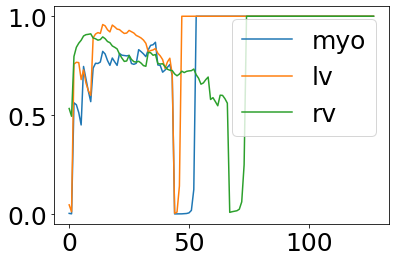

In [57]:
plt.plot(myos, label='myo')
#plt.plot(myos_gt, label='myo gt')
plt.plot(lvs, label='lv')
plt.plot(rvs, label='rv')
plt.legend()
plt.show()


In [51]:
scores = list(zip(myos,myos_gt, lvs, lvs_gt, rvs, rvs_gt))
scores[50]

(0.0070921984, 1, 1.0, 1, 0.7240527, 0)

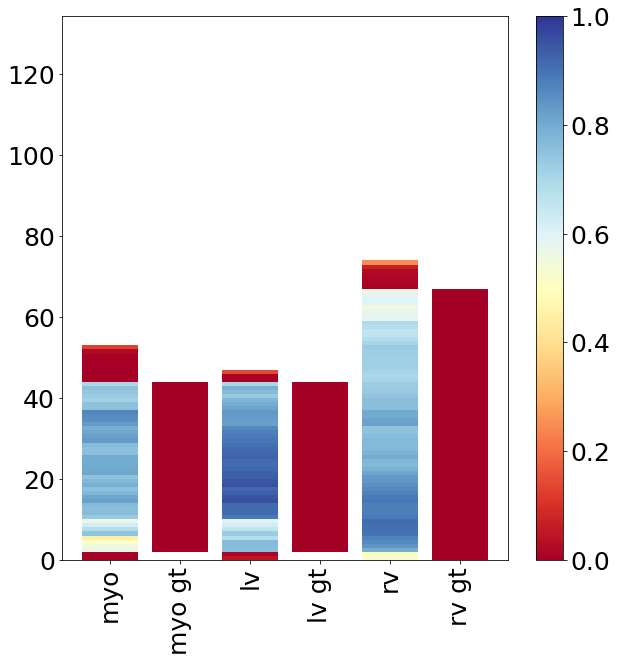

In [55]:
import matplotlib
plt.rcParams.update({'font.size':25})
bottom=0
cmap = matplotlib.cm.get_cmap('RdYlBu')
def custom_map(value):
    color = [cmap(v) if v <1 else (1,1,1,0) for v in value]
    return color
        
fig, ax = plt.subplots(figsize=(10,10))
elements = range(len(scores))
for v in scores:
    rects = ax.bar([0,1,2,3,4,5],1,bottom=bottom, color=custom_map(v))
    bottom+=1
fig.colorbar(matplotlib.cm.ScalarMappable(cmap=cmap),ax=ax)
plt.xticks([0,1,2,3,4,5],['myo','myo gt','lv', 'lv gt','rv', 'rv gt'], rotation=90)
plt.show()


In [117]:
cmap(1)

(0.6547481737793157, 0.007381776239907728, 0.14917339484813533, 1.0)

In [ ]:
# check the memory usage
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)


In [9]:
# Load a previous config and by this a pre-trained model
from ipyfilechooser import FileChooser
config_chooser = FileChooser(os.path.join(os.getcwd(),'reports/configs'), 'config.json')
display(config_chooser) # 3D/wrapper/fold1/last

FileChooser(path='/mnt/data/git/cardio/reports/configs', filename='config.json', show_hidden='False')

In [39]:
# 2D unet
"""
load past config for model training 
"""
if 'strategy' in globals():
    pass
else:
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
tf.print('Number of devices: {}'.format(strategy.num_replicas_in_sync))
if 'config_chooser' in locals():
    config_file  = config_chooser.selected
else:
    #config_file = '/mnt/data/git/cardio/reports/configs/3D/wrapper/gcn_and_acdc_exlusive_ax/2020-07-23_20_49/config.json'
    config_file = '/mnt/data/git/cardio/reports/configs/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/config.json'
load = True # change to false, if this pipeline is used without finetuning
# load config with all params into global namespace
from src.models.ModelUtils import load_pretrained_model
if load: # load pretrained model
    with open(config_file, encoding='utf-8') as data_file:
        config_temp = json.loads(data_file.read())
    config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
    logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))
    #logging.info('config:\n {}'.format(json.dumps(config, indent=4, sort_keys=True)))

    try:
        with strategy.scope():
            globals()['unet'] = load_pretrained_model(config_temp, metrics, comp=False)
            #globals()['unet'].summary()
    except Exception as e:
        logging.error(str(e))

Number of devices: 2


2020-08-08 08:57:27,869 INFO Load model from Experiment: 2D/ax_sax/gcn_and_acdc_exlusive_ax/
2020-08-08 08:57:27,869 INFO load model with keras api
2020-08-08 08:57:30,021 INFO Unable to restore custom object of type _tf_keras_metric currently. Please make sure that the layer implements `get_config`and `from_config` when saving. In addition, please use the `custom_objects` arg when calling `load_model()`.
2020-08-08 08:57:30,021 INFO Keras API failed, use json repr. load model from: models/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/model.json .
2020-08-08 08:57:30,022 INFO loading model description
2020-08-08 08:57:31,235 INFO loading model weights
2020-08-08 08:57:31,398 INFO model models/2D/ax_sax/gcn_and_acdc_exlusive_ax/2020-07-23_17_19/model.json loaded
